# ML 102. Где дешевле жить? Предсказание цен в Airbnb — учимся генерировать признаки и интерпретировать результаты модели. Линейная регрессия.

<a id="toc"></a>
# Содержание

* [TL;DR](#tldr)
* [Разведочный анализ данных](#eda)
 * [Загрузка и знакомство с данными](#load)
 * [Дубликаты](#dups)
 * [Проверка полноты данных](#isna)
 * [Статистики](#stats)
* [Предобработка и Feature Engeneering](#feat)
 * [Категориальные признаки](#cat)
   * [neighbourhood_group](#neighbourhood_group)
   * [neighbourhood](#neighbourhood)
   * [room_type](#room_type)
 * [Непрерывные признаки](#cont)
   * [price — целевая переменная](#price)
   * [minimum_nights](#minimum_nights)
   * [number_of_reviews](#number_of_reviews)
   * [reviews_per_month](#reviews_per_month)
   * [calculated_host_listings_count](#calculated_host_listings_count)
   * [availability_365](#availability_365)
 * [Географические соображения](#geo)
   * [Расстояние до Манхэттена](#manh)
   * [Расстояние до ближайшей станции метро](#metro)
 * [Корреляция](#corr)
   * [Парные графики](#pairplots)
   * [Тепловая карта корреляций](#heatmap)
   * [Попарно коррелирующие признаки](#pairwise)
* [Утилиты](#utils)
   * [Извлечение названий признаков из препроцессора](#feat_names)
   * [Метрики](#metrics)
     * [Скорректированный (adjusted) R<sup>2</sup>](#adjr2)
   * [Визуализация важности признаков](#feat_importance)
   * [Визуализация результатов моделирования](#mlplot)
   * [Генератор моделей](#pipes)
* [Моделирование](#ml)
   * [Моделирование с выбросами](#outliers)
   * [Удаление выбросов](#dropout)
   * [Точка отсчёта](#baseline)
   * [Моделирование без учёта категориальных признаков](#nocats)
   * [Моделирование с категориальными признаками](#cats)
       * [OneHotEncoder](#ohe)
       * [CatBoostEncoder](#catboost)
   * [Моделирование с добавлением географических признаков](#add_geo)
     * [Расстояние до Манхэттена](#add_manh)
     * [Расстояние до метро](#add_metro)
     * [Метро+Манхэттен](#add_swmh)
     * [Метро+Манхэттен без координат в явном виде](#nocoords)
   * [Масштабирование признаков](#scaling)
     * [Без масштабирования признаков](#noscale)
     * [Масштабирование StandardScaler'ом](#znorm)
     * [Масштабирование RobustScaler'ом](#rnorm)
     * [Масштабирование MinMaxScaler'ом](#mnorm)
   * [Логарифмирование признаков](#log)
   * [Трансформация целевой переменной](#target_transform)
     * [Логарифмирование целевой переменной](#tt_log)
     * [Нормализация целевой переменной](#tt_norm)
   * [Стратификация](#stratum)
     * [Cтратификация по neighbourhood_group](#strat_neig)
     * [Cтратификация по room_type](#strat_room_type)
     * [Cтратификация по neighbourhood](#strat_neighbourhood)
   * [Признак удалённости от метро](#sw_farness)
   * [Признак доступности](#avialableness)
   * [Виндзоризация выбросов](#windsor)
     * [Без разметки заменённых выбросов](#no_w_mark)
     * [C разметкой заменённых выбросов](#with_w_mark)
* [Интерпретация моделей (важность признаков)](#interpretation)
* [Отбор признаков на основе коэффициентов](#selection)
   * [Отбор признаков на основе коэффициентов LassoCV](#selLasso)
   * [Отбор признаков на основе коэффициентов ElasticNetCV](#selElastic)
* [Сводная таблица результатов](#total)

<a id="tldr"></a>
# TL;DR [⇑](#toc)

* Для работы с численными признаками попробовал: шкалирование (Std, Robust, MinMax), логарифмирование, удаление выбросов, виндзоризацию выбросов с пометкой выбросов отдельным бинарным признаком.
* Для целевой переменной попробовал трансформации: логарифмирование и нормализацию QuantileTransformer'ом.
* Для категориальных признаков попробовал два способа кодирования: OneHot и CatBoost.
* Попробовал разбиение выборки на тестовую и тренировочную со стратификацией по категориальным переменнымм.
* Добавил новый признак <b>Расстояние до Манхэттена</b>.
* Добавил новый признак <b>Расстояние до ближайшего входа в метро</b>.
* Добавил новый бинарный признак <b>Далеко от метро</b>, на основе поиска выбросов по признаку <b>Расстояние до ближайшего входа в метро</b>.
* Добавил новый признак <b>Доступность для бронирования</b> на основе признака <b>availability_365<b> == 0.
* Попробовал отбор признаков на основе коэффициентов лучших вариантов моделей с LassoCV и ElasticNetCV.


| Помогло                                                                                                                                                                              | Не помогло                                                                                     |
|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|------------------------------------------------------------------------------------------------|
| Удаление выбросов                                                                                                                                                                    | Виндзоризация выбросов                                                                         |
| StandardScaler                                                                                                                                                                       | RobustScaler<br>MinMaxScaler                                                                   |
| Логарифмирование признаков<br>Логарифмирование целевой переменной                                                                                                                    | Нормализация целевой переменной                                                                |
| OnHotEncoder                                                                                                                                                                         | CatBoostEncoder                                                                                |
| Стратификация по признаку <b>neighbourhood_group</b>                                                                                                                                 | Стратификация по признакам<br><b>room_type</b> и <b>neighbourhood</b>                          |
| Добавление новых признаков:<br><b>Расстояние до Манхэттена</b>.<br><b>Расстояние до ближайшего входа в метро</b>.<br><b>Далеко от метро</b>.<br><b>Доступность для бронирования</b>. | Удаление координат при добавлении<br>признаков-расстояний,<br>вычисленных на основе координат. |
| Отбор признаков на основе коэффициентов моделей.                                                                                                                                     |                                                                                                |

Лучшей моделью по RMSE стала модель RidgeCV с добавленными признаками <b>Расстояние до Манхэттена</b> и <b>Расстояние до ближайшего входа в метро</b>, с OneHot-кодированием, со шкалированием StandardScaler'ом и логарифмированием признаков.
<br>
<br>
Но если пожертвовать 1 десятой в RMSE, то лучшая однозначно модель, у которой MAE меньше на 5, а медианная AE меньше на 7.<br>
Это также модель RidgeCV, к которой по сравнению с предыдущей добавлены признаки <b>Далеко от метро</b> и <b>Доступность для бронирования</b>, добавлено логарифмирование целевой переменной и стратификация по признаку <b>neighbourhood_group</b>.
<br>
<br>
Модель, полученная из второй вышеописанной с помощью отбора признаков на основании коэффициентов LassoCV показала метрики отличающиеся от лучшей модели на десятые и сотые доли. При этом количество признаков сократилось на 144!

<a id="eda"></a>
# Разведочный анализ данных [⇑](#toc)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import warnings

warnings.filterwarnings("ignore")
np.set_printoptions(precision=3)
plt.style.use('seaborn-colorblind')

random_state=42
np.random.seed(random_state)

%matplotlib inline

<a id="load"></a>
### Загрузка и знакомство с данными [⇑](#toc)

In [2]:
# Переменные, которые пока нужно убрать: id, name, host_id, host_name, last_review.
usecols = ['neighbourhood_group','neighbourhood','latitude','longitude','room_type','price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365']

# Численные признаки укладываются в 32 бита так что для уменьшения размера данных в памяти явно задам типы данных.
dtype = {'neighbourhood_group':np.unicode_,'neighbourhood':np.unicode_,'latitude':np.float32,'longitude':np.float32,'room_type':np.unicode_,'price':np.int32,'minimum_nights':np.int32,'number_of_reviews':np.int32,'reviews_per_month':np.float32,'calculated_host_listings_count':np.int32,'availability_365':np.int32}

data = pd.read_csv('AB_NYC_2019.csv', usecols=usecols, dtype=dtype)

In [3]:
print(data.shape)

(48895, 11)


In [4]:
data.sample(5, random_state=random_state)

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
879,Brooklyn,Kensington,40.643539,-73.977768,Entire home/apt,89,3,62,0.71,1,189
44383,Queens,Ridgewood,40.706661,-73.907791,Private room,30,21,0,NaN,1,73
15394,Manhattan,Hell's Kitchen,40.761162,-73.990158,Private room,120,2,17,0.43,1,0
43230,Manhattan,Financial District,40.707630,-74.010498,Entire home/apt,470,2,5,1.88,327,272
16332,Manhattan,East Harlem,40.796581,-73.932869,Entire home/apt,199,2,30,0.80,1,30


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             48895 non-null  object 
 1   neighbourhood                   48895 non-null  object 
 2   latitude                        48895 non-null  float32
 3   longitude                       48895 non-null  float32
 4   room_type                       48895 non-null  object 
 5   price                           48895 non-null  int32  
 6   minimum_nights                  48895 non-null  int32  
 7   number_of_reviews               48895 non-null  int32  
 8   reviews_per_month               38843 non-null  float32
 9   calculated_host_listings_count  48895 non-null  int32  
 10  availability_365                48895 non-null  int32  
dtypes: float32(3), int32(5), object(3)
memory usage: 2.6+ MB


<a id="dups"></a>
### Дубликаты [⇑](#toc)

In [6]:
data.duplicated().value_counts()

False    48895
dtype: int64

Дубликатов нет.

<a id="isna"></a>
### Проверка полноты данных [⇑](#toc)

In [7]:
incomplete = data.isna().mean()*100
print(incomplete[incomplete > 0])

reviews_per_month    20.558339
dtype: float64


Пропуски только по количеству отзывов за месяц.<br>
Возможно это имеет значение для предсказания, так что оставлю пока эти пропуски до этапа предобработки.

<a id="stats"></a>
### Статистики [⇑](#toc)

In [8]:
data.describe(percentiles=[.25, .5, .75, .9, .95, .99]).T

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
latitude,48895.0,40.730587,0.054555,40.499790,40.690102,40.723068,40.763115,40.804890,40.825644,40.864659,40.913059
longitude,48895.0,-73.969963,0.049468,-74.244423,-73.983070,-73.955681,-73.936275,-73.907806,-73.865775,-73.776922,-73.712990
price,48895.0,152.720687,240.154170,0.000000,69.000000,106.000000,175.000000,269.000000,355.000000,799.000000,10000.000000
minimum_nights,48895.0,7.029962,20.510550,1.000000,1.000000,3.000000,5.000000,28.000000,30.000000,45.000000,1250.000000
number_of_reviews,48895.0,23.274466,44.550582,0.000000,1.000000,5.000000,24.000000,70.000000,114.000000,214.000000,629.000000
reviews_per_month,38843.0,1.373218,1.680445,0.010000,0.190000,0.720000,2.020000,3.630000,4.640000,7.195800,58.500000
calculated_host_listings_count,48895.0,7.143982,32.952519,1.000000,1.000000,1.000000,2.000000,5.000000,15.000000,232.000000,327.000000
availability_365,48895.0,112.781327,131.622289,0.000000,0.000000,45.000000,227.000000,337.000000,359.000000,365.000000,365.000000


Есть бесплатные апартаменты.<br>
Распределение цен с тяжёлым хвостом.<br>
Есть недоступные в течение всего года апартаменты.<br>

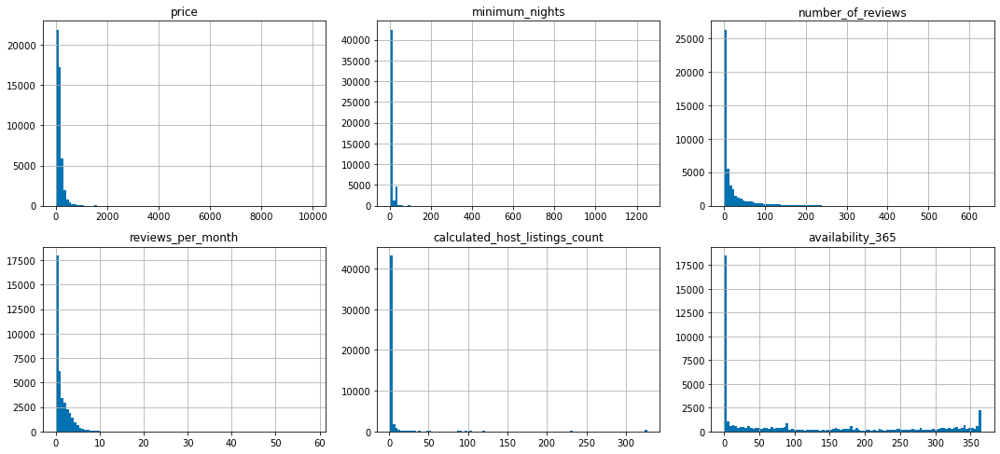

In [9]:
fig = plt.figure(figsize=(15,10))
ax = plt.gca()
data.hist(bins=100, ax=ax, layout=(3, 3), column=['price', 'minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365'])
plt.tight_layout()
plt.show()

Распределения с тяжёлыми хвостами. Повод для преобразования, нормализации и работы с выбросами.

<a id="feat"></a>
# Предобработка и Feature Engeneering [⇑](#toc)

In [10]:
def outlier_detect_IQR(data, col, threshold=3):   
    """Определяем выбросы через интерквартильное расстояние."""
    q25 = data[col].quantile(0.25)
    q75 = data[col].quantile(0.75)
    IQR = q75 - q25
    lower_fence = q25 - (IQR * threshold)
    upper_fence = q75 + (IQR * threshold)
    tmp = pd.concat([data[col] > upper_fence, data[col] < lower_fence], axis=1)
    outlier_index = tmp.any(axis=1)
    ovc = outlier_index.value_counts()

    if len(ovc) == 1:
        print('Выбросов нет')
    else:
        outlier_count = outlier_index.value_counts()[1]
        print('Количество выбросов в данных:', outlier_count)
        print('Доля выбросов:', f'{(100 * outlier_count / len(outlier_index)):.2f}%')
        print('Верхняя граница:', upper_fence, '\nНижняя граница:', lower_fence)

    return outlier_index, lower_fence, upper_fence

def drop_outlier(data, outlier_index):
    """Выкидываем выбросы."""
    data_copy = data[~outlier_index]
    return data_copy

In [11]:
def plot_feat(feat, target='price', data=data, log=False):
    """Строит графики распределения заданного признака
        
        Параметры
        ----------
        feat : str
            Имя признака.
        target : str
            Имя целевой переменной, используется только для категориальных пепременных.
            Нужно для графика распределения целевой переменной в зависимости от feat.
        data: dataframe
            Набор данных в формате Pandas, которым принадлежит feat.
        log: bool
            Если True, то строятся графики распределения признака после его логарифмирования.
    """
    
    is_cat_feat = data.dtypes[feat] == 'object'
    nunique = data[feat].nunique() if is_cat_feat else 0
    unique_threshold = 7
    big_cat = nunique > unique_threshold
    
    feat_data = np.log1p(data[feat]) if log else data[feat]
    
    def plot_hist(ax, kde=True):
        feat_data.hist(ax=ax, bins=100, density=True)
        #sns.histplot(feat_data, ax=ax, kde=kde)
        ax.set_ylabel('')
        ax.set_xlabel('')
    
    def plot_box(ax):
        sns.boxplot(feat_data, ax=ax, dodge=True)
        ax.set_xlabel('')
        
    def plot_cat(ax):
        g = sns.boxplot(x=target, y=feat, data=data[data[target]>0], ax=ax)
        g.set(xscale="log")
        ax.set_ylabel('')
        
    def plot_counts(ax):
        sns.countplot(feat_data, ax=ax)
        ax.set_xlabel('')
        ax.set_ylabel('')
        if big_cat:
            ax.tick_params(axis='x', labelrotation=90)
   
    fig = plt.figure(constrained_layout=False, figsize=(18, 7 if is_cat_feat else 5), dpi=300)
    
    if is_cat_feat & big_cat:
        hist_ax = fig.add_subplot(1, 1, 1)
        plot_counts(hist_ax)
    else:
        gs = GridSpec(1, 2, figure=fig)
        hist_ax = fig.add_subplot(gs[0, 0])
        box_ax  = fig.add_subplot(gs[0, 1])

        if is_cat_feat:
            plot_counts(hist_ax)
            plot_cat(box_ax)
        else:
            plot_hist(hist_ax)
            plot_box(box_ax)
    
    fig.suptitle(f'Распределение признака {feat}{" после его логарифмирования" if log else ""}')
    sns.despine()
    plt.tight_layout()
    plt.show()

<a id="cat"></a>
## Категориальные признаки [⇑](#toc)

In [12]:
# Названия категориальных признаков
cats = ['neighbourhood_group', 'room_type', 'neighbourhood']

<a id="neighbourhood_group"></a>
### neighbourhood_group [⇑](#toc)

In [13]:
data['neighbourhood_group'].nunique()

5

Всего пять категорий - кандидат для OHE

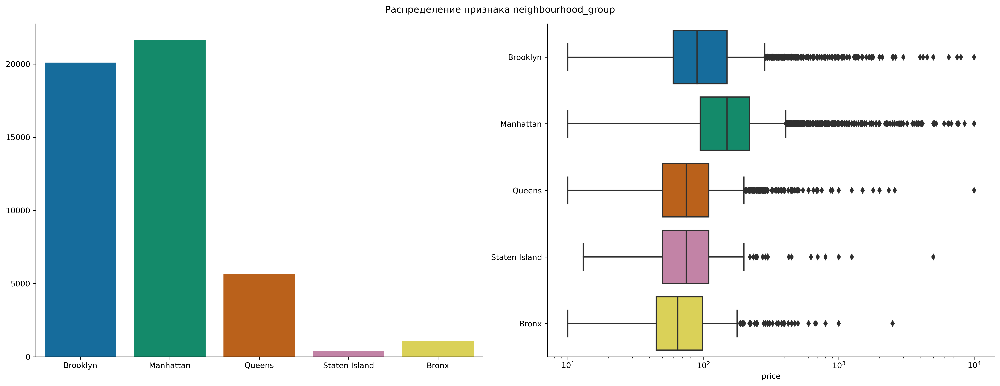

In [14]:
plot_feat('neighbourhood_group', 'price')

<a id="neighbourhood"></a>
### neighbourhood [⇑](#toc)

In [15]:
data['neighbourhood'] = data['neighbourhood'].str.replace(',', '').str.replace('\'', '').str.replace(' ', '').str.replace('-', '').str.replace('.', '')

In [16]:
data['neighbourhood'].unique()

array(['Kensington', 'Midtown', 'Harlem', 'ClintonHill', 'EastHarlem',
       'MurrayHill', 'BedfordStuyvesant', 'HellsKitchen', 'UpperWestSide',
       'Chinatown', 'SouthSlope', 'WestVillage', 'Williamsburg',
       'FortGreene', 'Chelsea', 'CrownHeights', 'ParkSlope',
       'WindsorTerrace', 'Inwood', 'EastVillage', 'Greenpoint',
       'Bushwick', 'Flatbush', 'LowerEastSide', 'ProspectLeffertsGardens',
       'LongIslandCity', 'KipsBay', 'SoHo', 'UpperEastSide',
       'ProspectHeights', 'WashingtonHeights', 'Woodside',
       'BrooklynHeights', 'CarrollGardens', 'Gowanus', 'Flatlands',
       'CobbleHill', 'Flushing', 'BoerumHill', 'Sunnyside', 'DUMBO',
       'StGeorge', 'Highbridge', 'FinancialDistrict', 'Ridgewood',
       'MorningsideHeights', 'Jamaica', 'MiddleVillage', 'NoHo',
       'DitmarsSteinway', 'FlatironDistrict', 'RooseveltIsland',
       'GreenwichVillage', 'LittleItaly', 'EastFlatbush', 'Tompkinsville',
       'Astoria', 'ClasonPoint', 'Eastchester', 'Kingsbridge

Многовато для OHE, попробую частотное кодирование.<br>
Так как количество измерений в наборе данных на два порядка больше чем количество категорий, так что попробую и OHE.

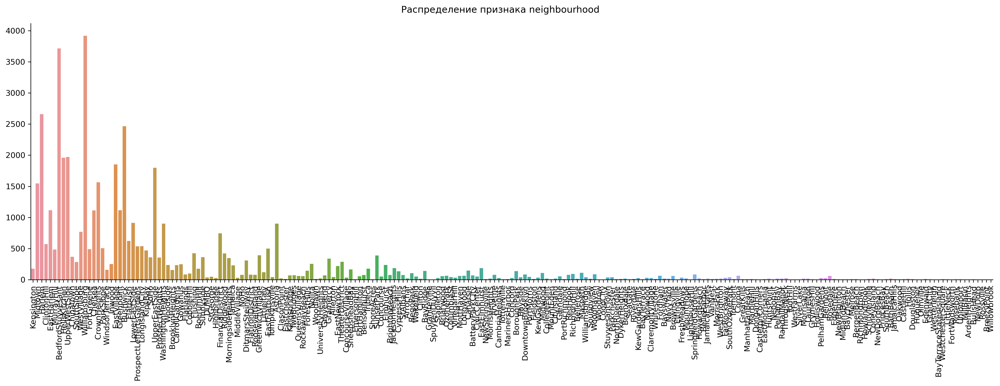

In [17]:
plot_feat('neighbourhood', 'price')

<a id="room_type"></a>
### room_type [⇑](#toc)

In [18]:
data['room_type'].nunique()

3

Также кандидат для OHE

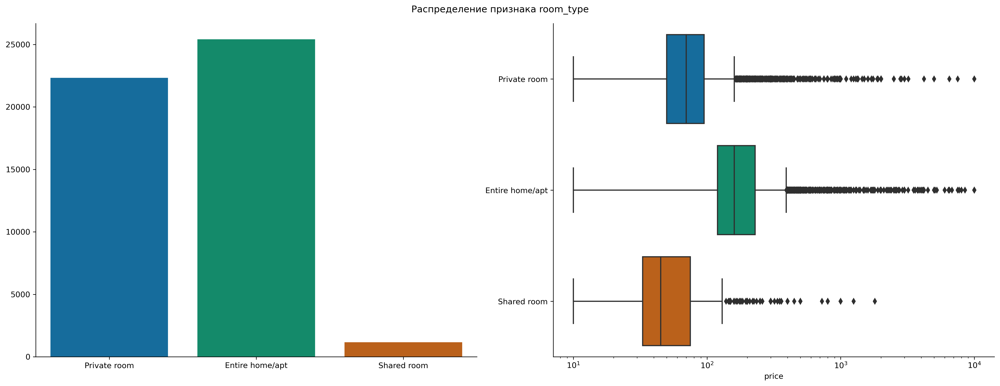

In [19]:
plot_feat('room_type', 'price')

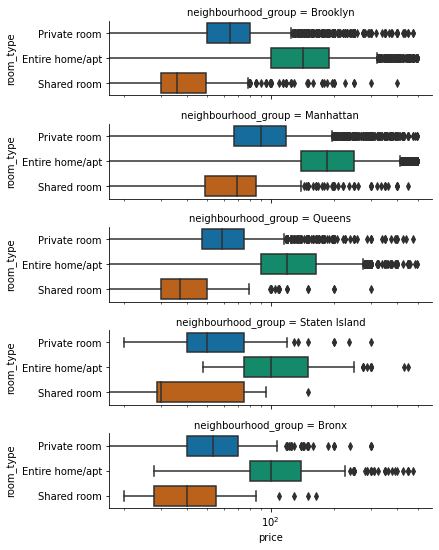

In [20]:
g = sns.catplot(x='price', y='room_type', row='neighbourhood_group', kind="box", orient="h", height=1.5, aspect=4, data=data[data['price'] < 500])
g.set(xscale="log")
plt.show()

<a id="cont"></a>
## Непрерывные признаки [⇑](#toc)

In [21]:
nums = ['minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365']
target = ['price']

<a id="price"></a>
### price — целевая переменная [⇑](#toc)

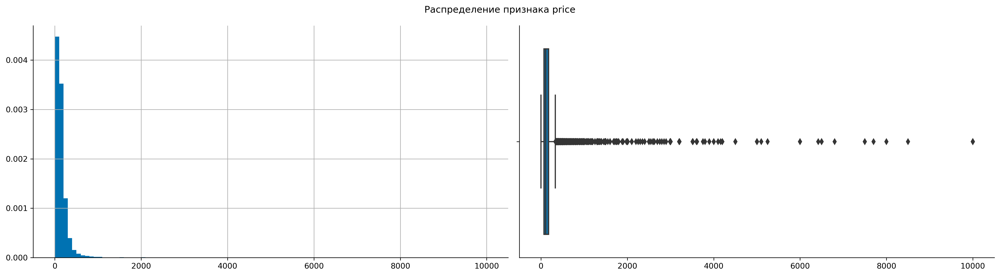

In [22]:
plot_feat('price')

Распределение с очень тяжёлым хвостом.<br>
Возможно это плохо скажется на регрессии, поэтому попробую трансформацию целевой переменной перед обучением:<br>
https://scikit-learn.org/stable/auto_examples/compose/plot_transformed_target.html#sphx-glr-auto-examples-compose-plot-transformed-target-py

[Cтатистики ⇑](#stats) показали, что есть бесплатные апартаменты, проверю что это и сколько их:

In [23]:
data[data['price']==0]

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
23161,Brooklyn,BedfordStuyvesant,40.690231,-73.954277,Private room,0,4,1,0.05,4,28
25433,Bronx,EastMorrisania,40.832958,-73.886681,Private room,0,2,55,2.56,4,127
25634,Brooklyn,Bushwick,40.694672,-73.924332,Private room,0,2,16,0.71,5,0
25753,Brooklyn,Greenpoint,40.724621,-73.940720,Private room,0,2,12,0.53,2,0
25778,Brooklyn,Williamsburg,40.708382,-73.946449,Entire home/apt,0,5,3,0.15,1,73
25794,Brooklyn,BedfordStuyvesant,40.681728,-73.913422,Private room,0,1,93,4.28,6,176
25795,Brooklyn,BedfordStuyvesant,40.682789,-73.911697,Private room,0,1,95,4.37,6,232
25796,Brooklyn,BedfordStuyvesant,40.682579,-73.912842,Private room,0,1,95,4.35,6,222
26259,Manhattan,MurrayHill,40.750912,-73.975967,Entire home/apt,0,3,0,NaN,1,0
26841,Brooklyn,Bushwick,40.692108,-73.906700,Shared room,0,30,2,0.11,6,333


Итого бесплатных всего 11 штук — очень похоже на аномалию.
Удалю их.

In [24]:
data.drop(data.loc[data['price']==0].index, inplace=True)

Выбросы

In [25]:
price_out_index, price_out_low, price_out_up = outlier_detect_IQR(data=data, col='price', threshold=5)

Количество выбросов в данных: 589
Доля выбросов: 1.20%
Верхняя граница: 705.0 
Нижняя граница: -461.0


Посмотрим как будет выглядеть распределение целевой переменной после удаления выбросов и логарифмирования.

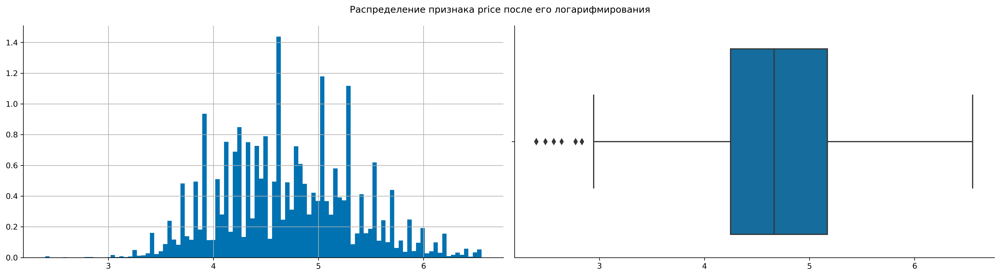

In [26]:
plot_feat('price', data=drop_outlier(data, price_out_index), log=True)

Гораздо лучше.

<a id="minimum_nights"></a>
### minimum_nights [⇑](#toc)

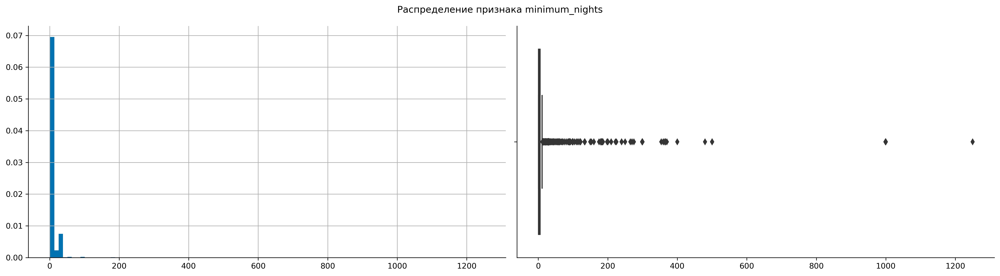

In [27]:
plot_feat('minimum_nights')

Выбросы

In [28]:
minimum_nights_out_index, minimum_nights_out_low, minimum_nights_out_up = outlier_detect_IQR(data=data, col='minimum_nights', threshold=7)

Количество выбросов в данных: 536
Доля выбросов: 1.10%
Верхняя граница: 33.0 
Нижняя граница: -27.0


Для виндзоризации добавлю бинарный признак выброс/не выброс.

In [29]:
data['minimum_nights_w'] = minimum_nights_out_index.astype(int)
data['minimum_nights_w'].value_counts()

0    48348
1      536
Name: minimum_nights_w, dtype: int64

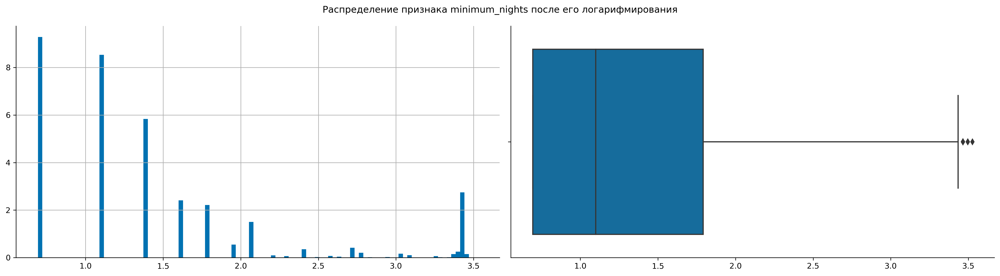

In [30]:
plot_feat('minimum_nights', data=drop_outlier(data, minimum_nights_out_index), log=True)

<a id="number_of_reviews"></a>
### number_of_reviews [⇑](#toc)

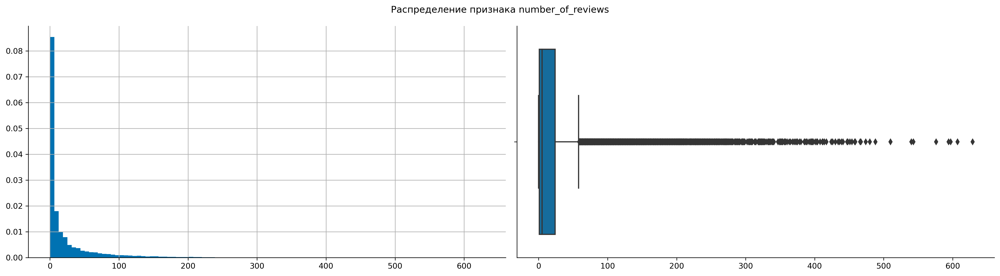

In [31]:
plot_feat('number_of_reviews')

Выбросы

Количество выбросов в данных: 1611
Доля выбросов: 3.30%
Верхняя граница: 139.0 
Нижняя граница: -114.0


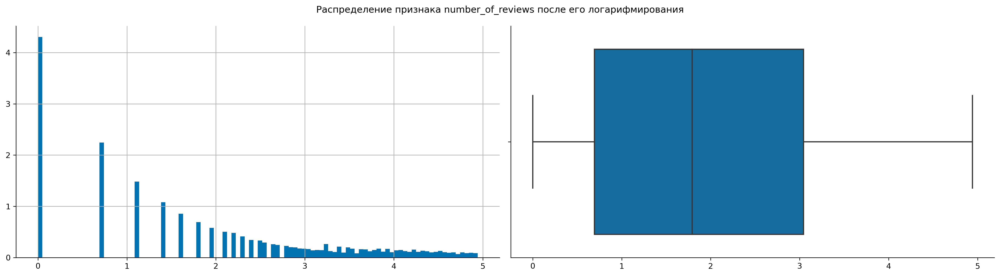

In [32]:
number_of_reviews_out_index, number_of_reviews_out_low, number_of_reviews_out_up = outlier_detect_IQR(data=data, col='number_of_reviews', threshold=5)
plot_feat('number_of_reviews', data=drop_outlier(data, number_of_reviews_out_index), log=True)

Для виндзоризации добавлю бинарный признак выброс/не выброс.

In [33]:
data['number_of_reviews_w'] = number_of_reviews_out_index.astype(int)
data['number_of_reviews_w'].value_counts()

0    47273
1     1611
Name: number_of_reviews_w, dtype: int64

<a id="reviews_per_month"></a>
### reviews_per_month [⇑](#toc)

Для этого признака имеем ~20% пропусков.<br>
Скорее всего именно для этих апартаментов в принципе нет рецензий.

In [34]:
data[['number_of_reviews']][data['reviews_per_month'].isna()].sum()

number_of_reviews    0
dtype: int64

Так и есть, поэтому посто заполню пропуски нулями.

In [35]:
data['reviews_per_month'].fillna(0, inplace=True)
data['number_of_reviews'].isna().sum()

0

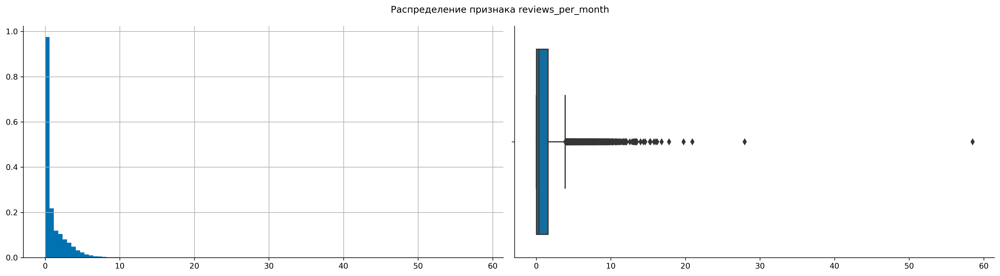

In [36]:
plot_feat('reviews_per_month')

Количество выбросов в данных: 127
Доля выбросов: 0.26%
Верхняя граница: 9.280000261962414 
Нижняя граница: -7.660000219941139


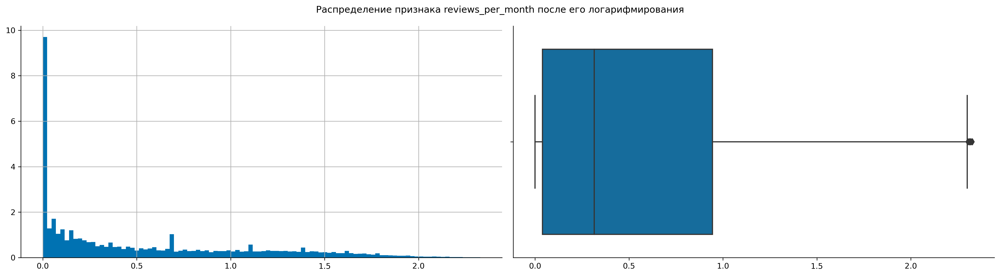

In [37]:
reviews_per_month_out_index, reviews_per_month_out_low, reviews_per_month_out_up = outlier_detect_IQR(data=data, col='reviews_per_month', threshold=5)
plot_feat('reviews_per_month', data=drop_outlier(data, reviews_per_month_out_index), log=True)

Для виндзоризации добавлю бинарный признак выброс/не выброс.

In [38]:
data['reviews_per_month_w'] = reviews_per_month_out_index.astype(int)
data['reviews_per_month_w'].value_counts()

0    48757
1      127
Name: reviews_per_month_w, dtype: int64

<a id="calculated_host_listings_count"></a>
### calculated_host_listings_count [⇑](#toc)

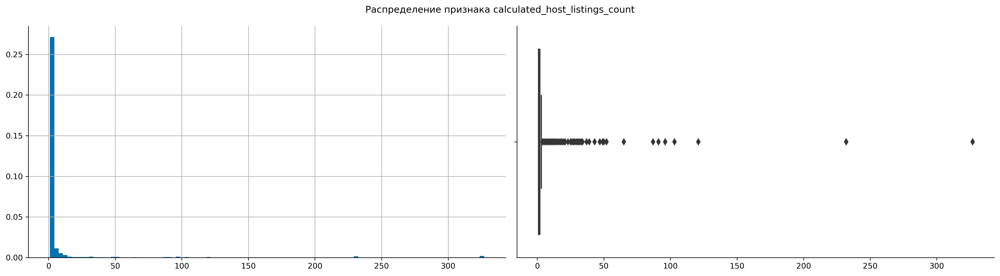

In [39]:
plot_feat('calculated_host_listings_count')

Выбросы

Количество выбросов в данных: 3827
Доля выбросов: 7.83%
Верхняя граница: 7.0 
Нижняя граница: -4.0


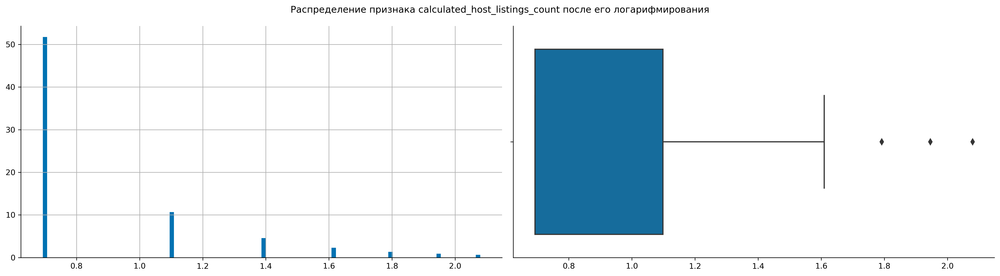

In [40]:
calculated_host_listings_count_out_index, calculated_host_listings_count_out_low, calculated_host_listings_count_out_up = outlier_detect_IQR(data=data, col='calculated_host_listings_count', threshold=5)
plot_feat('calculated_host_listings_count', data=drop_outlier(data, calculated_host_listings_count_out_index), log=True)

Очень много выбросов.<br>
На сайте ABnB есть интересное <a href="http://insideairbnb.com/new-york-city/">описание</a> этого признака:

Listings per Host<br>
Some Airbnb hosts have multiple listings.<br>
A host may list separate rooms in the same apartment, or multiple apartments or homes available in their entirity.<br>
Hosts with multiple listings are more likely to be running a business without a license and not paying taxes,<br> 
and if they are renting out an entire home or apartment and aren't present, are probably doing so illegally.

Иными словами это скорее всего какие-то хостелы, уклоняющиеся от налогов.<br>

Для виндзоризации добавлю бинарный признак выброс/не выброс.

In [41]:
data['calculated_host_listings_count_w'] = calculated_host_listings_count_out_index.astype(int)
data['calculated_host_listings_count_w'].value_counts()

0    45057
1     3827
Name: calculated_host_listings_count_w, dtype: int64

<a id="availability_365"></a>
### availability_365 [⇑](#toc)

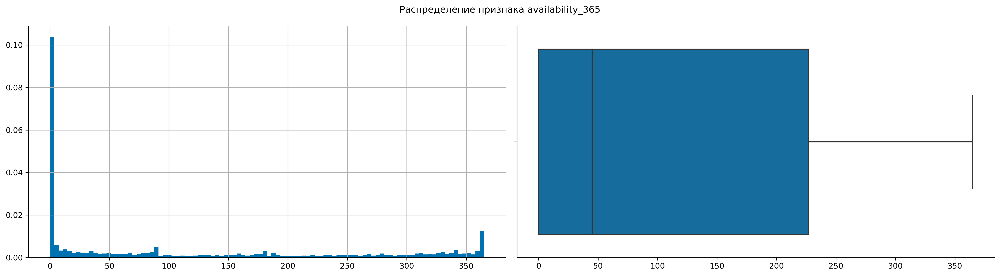

In [42]:
plot_feat('availability_365')

Выбросов нет


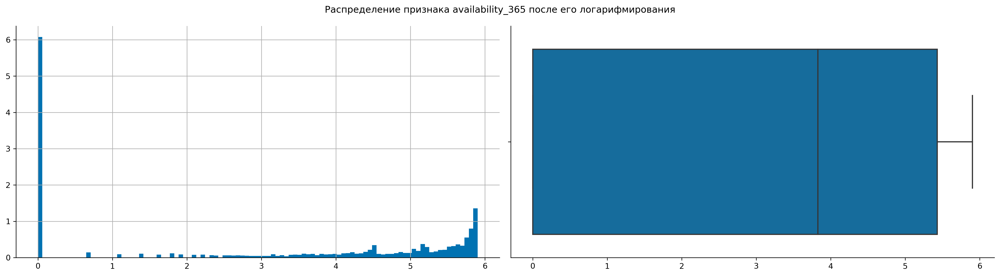

In [43]:
availability_365_out_index, availability_365_out_low, availability_365_out_up = outlier_detect_IQR(data=data, col='availability_365', threshold=5)
plot_feat('availability_365', log=True)

С диапазоном всё хорошо — максимум 365, т.е. апартаменты доступны для аренды круглый год.<br>
Но есть некоторое количество недоступных вообще — аномалия?

In [44]:
len(data[data['availability_365'] == 0])

17530

Многовато для аномалии.<br>
Гугл подсказал, что ABnB позволяет таким образом временно делать апартаменты недоступными для найма не удаляя их из системы.<br>
Это позволяет в дальнейшем снова выставить их для найма не заполняя всё с нуля.<br>

Попробую добавить новый бинарный признак avialable = data['availability_365'] != 0.

In [45]:
data['avialable'] = (data['availability_365'] != 0).astype(int)
data['avialable'].value_counts()

1    31354
0    17530
Name: avialable, dtype: int64

In [46]:
data

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,minimum_nights_w,number_of_reviews_w,reviews_per_month_w,calculated_host_listings_count_w,avialable
0,Brooklyn,Kensington,40.647491,-73.972366,Private room,149,1,9,0.21,6,365,0,0,0,0,1
1,Manhattan,Midtown,40.753620,-73.983772,Entire home/apt,225,1,45,0.38,2,355,0,0,0,0,1
2,Manhattan,Harlem,40.809021,-73.941902,Private room,150,3,0,0.00,1,365,0,0,0,0,1
3,Brooklyn,ClintonHill,40.685139,-73.959763,Entire home/apt,89,1,270,4.64,1,194,0,1,0,0,1
4,Manhattan,EastHarlem,40.798512,-73.943993,Entire home/apt,80,10,9,0.10,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,Brooklyn,BedfordStuyvesant,40.678532,-73.949951,Private room,70,2,0,0.00,2,9,0,0,0,0,1
48891,Brooklyn,Bushwick,40.701839,-73.933167,Private room,40,4,0,0.00,2,36,0,0,0,0,1
48892,Manhattan,Harlem,40.814751,-73.948669,Entire home/apt,115,10,0,0.00,1,27,0,0,0,0,1
48893,Manhattan,HellsKitchen,40.757511,-73.991119,Shared room,55,1,0,0.00,6,2,0,0,0,0,1


In [47]:
windsored_cols = ['minimum_nights_w', 'number_of_reviews_w', 'reviews_per_month_w', 'calculated_host_listings_count_w']

<a id="geo"></a>
# Географические соображения [⇑](#toc)

In [48]:
# Карта города рядом с данными намекает на графики :)
nyc_map=plt.imread('New_York_City_.png', format='PNG')

# Карту нужно растянуть на основании границ по координатам
latitude  = data['latitude']
longitude = data['longitude']
lat_max = latitude.max()
lat_min = latitude.min()
lon_min = longitude.min()
lon_max = longitude.max()
lon_min, lon_max, lat_min, lat_max

(-74.24442291259766, -73.7129898071289, 40.49979019165039, 40.91305923461914)

In [49]:
# Параметры для растяжения картинки с картой
map_extent=[-74.25, -73.7, 40.49, 40.913]

In [50]:
coords = ['latitude', 'longitude']
coord_price_cols = coords + ['price']
appt_coord = data[coords]

cheap_bound = 200
mid_bound = 400
expen_bound = 500

# Выделим четыре стоимостных группы апартаментов
cheap = data[(data['price'] < cheap_bound)][coord_price_cols].sample(5000, random_state=random_state)
mid = data[(data['price'] < mid_bound) & (data['price'] >= cheap_bound)][coord_price_cols].sample(3000, random_state=random_state)
expensive = data[(data['price'] < expen_bound) & (data['price'] >= mid_bound)][coord_price_cols]
lux = data[(data['price'] >= expen_bound)][coord_price_cols].sample(1000, random_state=random_state)

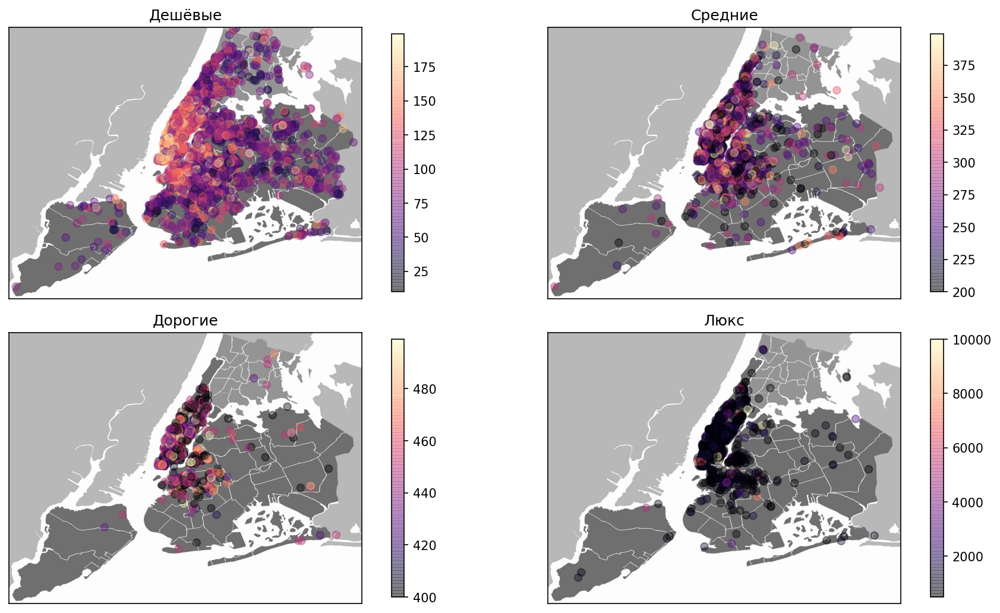

In [51]:
def plot_map(ax, data, title):
    ax.imshow(nyc_map, zorder=0, extent=map_extent)
    points = ax.scatter(data=data, x='longitude', y='latitude', alpha=0.4, zorder=4, c='price', cmap=plt.get_cmap('magma'))
    plt.colorbar(points, ax=ax, shrink=0.95)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    ax.set_title(title)

fig = plt.figure(figsize=(13,7), dpi=150)

gs = GridSpec(2, 2, figure=fig)
cheap_ax = fig.add_subplot(gs[0, 0])
mid_ax   = fig.add_subplot(gs[0, 1])
exp_ax   = fig.add_subplot(gs[1, 0])
lux_ax   = fig.add_subplot(gs[1, 1])

plot_map(cheap_ax, cheap, 'Дешёвые')
plot_map(mid_ax, mid, 'Средние')
plot_map(exp_ax, expensive, 'Дорогие')
plot_map(lux_ax, lux, 'Люкс')

plt.tight_layout()
plt.show()

Наиболее дорогие апартаменты ожидаемо сосредоточены на Манхэттене.

<a id="manh"></a>
## Расстояние до Манхэттена [⇑](#toc)

Попробую добавить признак "Расстояние до Манхэттена".

In [52]:
from sklearn.metrics.pairwise import euclidean_distances

In [53]:
# Координаты Манхэттена
manhattan = np.array([40.78343, -73.96625]).reshape(1, -1)
dist2mh = euclidean_distances(appt_coord, manhattan)
data['dist2mh'] = dist2mh

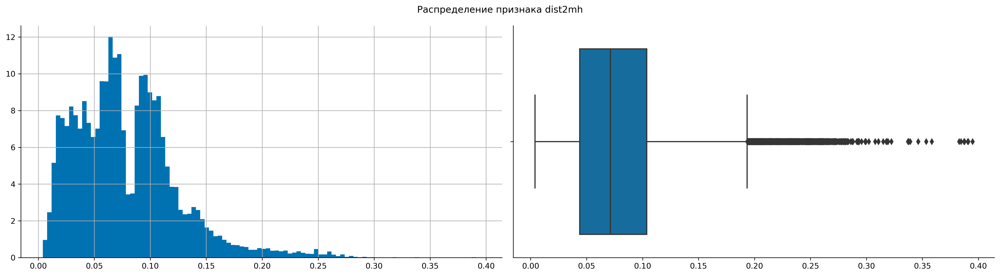

In [54]:
plot_feat('dist2mh')

In [55]:
dist2mh_out_index, dist2mh_out_low, dist2mh_out_up = outlier_detect_IQR(data=data, col='dist2mh', threshold=5)

Выбросов нет


<a id="metro"></a>
## Координаты станций метро [⇑](#toc)

Легко гуглится <a href="http://web.mta.info/developers/data/nyct/subway/StationEntrances.csv">набор данных</a> с координатами входов в Нью-Йоркское метро.<br>
Попробую добавить признак "Расстояние до ближайшего входа в метро".<br>
Тут я не буду учитывать доступность этого входа, т.е. случаи когда географически ближайший вход оказывается логистически труднодоступным, например он через речку и чтобы до него добраться нужно проехать 5км на автобусе, но рядом есть более удалённый географически, но находящийся на том же берегу вход.

In [56]:
metro = pd.read_csv('StationEntrances.csv', usecols=['Latitude', 'Longitude'], dtype={'Latitude':np.float32, 'Longitude':np.float32})
#metro = pd.read_csv('http://web.mta.info/developers/data/nyct/subway/StationEntrances.csv', usecols=['Latitude', 'Longitude'], dtype={'Latitude':np.float32, 'Longitude':np.float32})
metro.rename(columns = {'Latitude':'latitude', 'Longitude':'longitude'}, inplace = True) 

In [57]:
metro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1866 entries, 0 to 1865
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   1866 non-null   float32
 1   longitude  1866 non-null   float32
dtypes: float32(2)
memory usage: 14.7 KB


In [58]:
metro.sample(5)

,latitude,longitude
1697,40.858040,-73.867722
1680,40.722469,-73.997398
921,40.835728,-73.921059
275,40.865746,-73.927170
416,40.679371,-73.858025


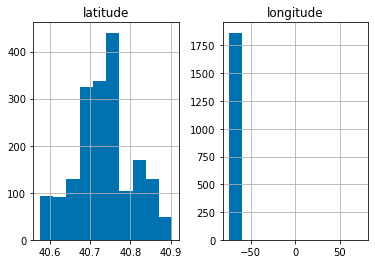

In [59]:
metro.hist()
plt.show()

Тут явная аномалия по долготе. Скорее всего потеряли знак.

In [60]:
metro.max()

latitude     40.903599
longitude    73.993324
dtype: float32

In [61]:
metro['longitude'].loc[(metro['longitude'] > -60)] = -metro['longitude'].loc[(metro['longitude'] > -60)]

In [62]:
metro[metro['longitude'] > -60]

,latitude,longitude


In [63]:
metro.max()

latitude     40.903599
longitude   -73.754181
dtype: float32

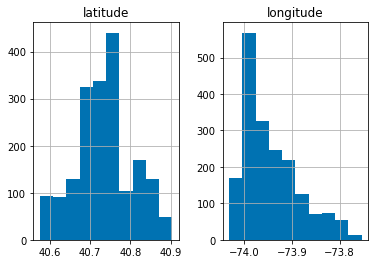

In [64]:
metro.hist()
plt.show()

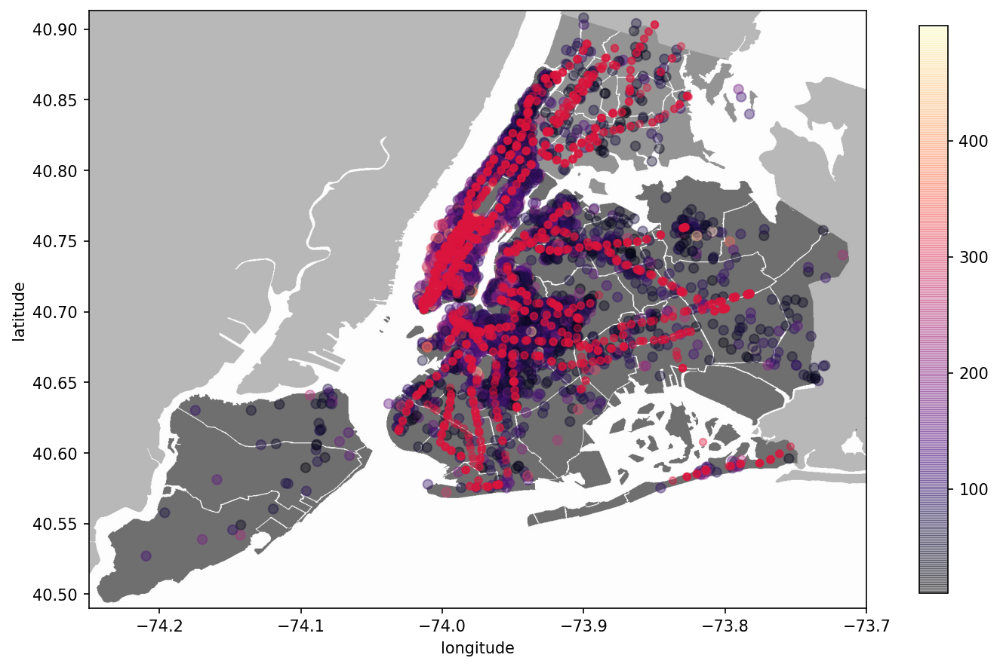

In [65]:
plt.figure(figsize=(12,7), dpi=150)
plt.imshow(nyc_map, zorder=0, extent=map_extent)
ax = plt.gca()
points = plt.scatter(data=data[data['price'] < 500].sample(5000, random_state=random_state), x='longitude', y='latitude', alpha=0.4, zorder=4, c='price', cmap=plt.get_cmap('magma'))
metro.plot(kind='scatter', x='longitude', y='latitude', zorder=7, alpha=0.4, color='crimson', ax=ax)
plt.colorbar(points, shrink=0.95)
plt.show()

Визуально кажется, что дорогие и средние по цене апартаменты находятся недалеко от метро. Естественно в тех районах города, в который в принципе есть метро.

In [66]:
# Попробую добавить признак "Расстояние до ближайшего входа в метро"
data['dist2sw'] = pd.DataFrame(euclidean_distances(appt_coord, metro), index=data.index).min(axis=1)

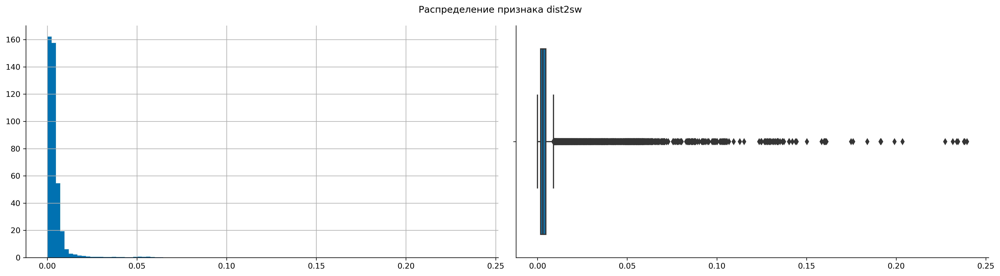

In [67]:
plot_feat('dist2sw')

In [68]:
dist2sw_out_index, dist2sw_out_low, dist2sw_out_up = outlier_detect_IQR(data=data, col='dist2sw', threshold=5)

Количество выбросов в данных: 1288
Доля выбросов: 2.63%
Верхняя граница: 0.019000962434802204 
Нижняя граница: -0.012625517323613167


Попробую виндзоризовать выбросы и добавить бинарный признак "Далеко от метро"

In [69]:
data['far_from_sw'] = dist2sw_out_index.astype(int)
data['far_from_sw'].value_counts()

0    47596
1     1288
Name: far_from_sw, dtype: int64

<a id="corr"></a>
## Корреляция [⇑](#toc)

In [71]:
def lower_triang(matrix):
    """Возвращает копию исходной матрицы с нулями на главной диагонали и в ячейках выше неё."""
    temp = matrix.copy()
    upper_triangle = np.triu(np.ones_like(matrix, dtype=bool), 1)
    temp = temp.where(upper_triangle == False, 0)
    np.fill_diagonal(temp.values, 0)
    return temp

def corr_features_with_threshold(corr, trheshold):
    """Печатает пары признаков с корреляцией больше заданного порога.
       Возвращает список таких признаков.
    """
    diag_corr = lower_triang(corr)
    corr_fields = []
    corr_pairs = []
    for i in diag_corr:
        for j in diag_corr.index[np.abs(diag_corr[i]) > trheshold]:
            if i == j:
                continue;
            if j not in corr_fields:
                corr_fields.append(j)
            if i not in corr_fields:
                corr_fields.append(i)
            corr_pairs.append((i,j))
            corr_coef = diag_corr[i][corr.index == j].values[0]
            print ("Признак", i, ("положительно" if corr_coef > 0 else "отрицательно"), "коррелирует с признаком", j, "с коэффициентом", corr_coef)
    return corr_fields, corr_pairs

def plot_correlations(corr_pairs, data=None, hue=None):
    """Строит графики корреляций"""
    def plot_pairwise_correlation(corr_pair):
        g = sns.lmplot(x=corr_pair[0], y=corr_pair[1], hue=hue, data=data);
        g.fig.suptitle(f"Зависимость {corr_pair[1]} от {corr_pair[0]}", y=1.05)
        plt.show()
    
    for c in corr_pairs:
        plot_pairwise_correlation(c)

In [72]:
data_prep = data.copy(deep=True)
data_prep = pd.get_dummies(data_prep, prefix='rt', columns=['room_type'], drop_first=True)
data_prep = pd.get_dummies(data_prep, prefix='nhg', columns=['neighbourhood_group'], drop_first=True)
nhf = data_prep.groupby('neighbourhood').size()/len(data_prep)
data_prep['neighbourhood'] = data_prep['neighbourhood'].apply(lambda x : nhf[x])

In [73]:
corr = data_prep.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

<a id="pairplots"></a>
### Парные графики [⇑](#toc)

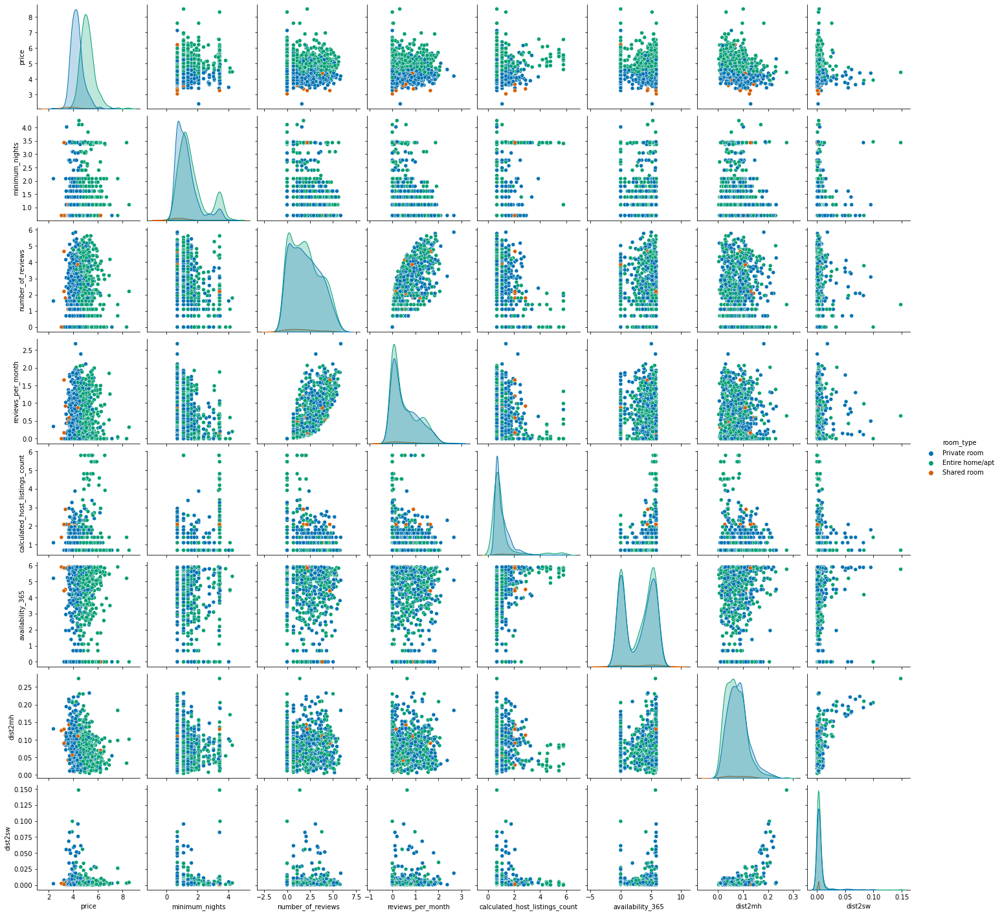

In [70]:
ncols = ['price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','dist2mh','dist2sw']
log_data = pd.concat([np.log1p(data[ncols]), data[['room_type']]], axis=1)
sns.pairplot(log_data.sample(1000, random_state=random_state), hue='room_type')
plt.show()

<a id="heatmap"></a>
### Тепловая карта корреляций [⇑](#toc)

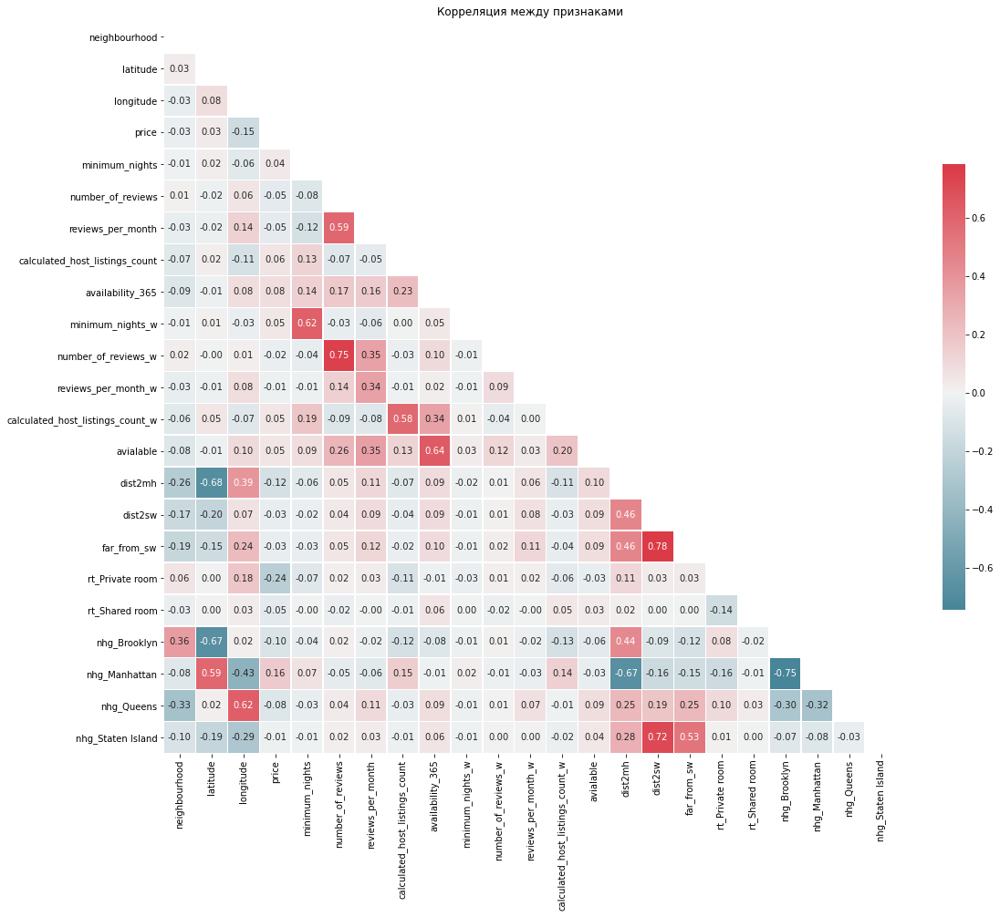

In [74]:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
f, ax = plt.subplots(figsize=(18, 18))
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=True, square=True, fmt=".2f", linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)
plt.title('Корреляция между признаками')
plt.show()

<a id="pairwise"></a>
### Попарно коррелирующие признаки [⇑](#toc)

In [75]:
corr_threshold = 0.7
corr_features, corr_pairs = corr_features_with_threshold(corr, corr_threshold)

Признак number_of_reviews положительно коррелирует с признаком number_of_reviews_w с коэффициентом 0.7486119406199419
Признак dist2sw положительно коррелирует с признаком far_from_sw с коэффициентом 0.7836287583083423
Признак dist2sw положительно коррелирует с признаком nhg_Staten Island с коэффициентом 0.7172505302311121
Признак nhg_Brooklyn отрицательно коррелирует с признаком nhg_Manhattan с коэффициентом -0.7452190934039166


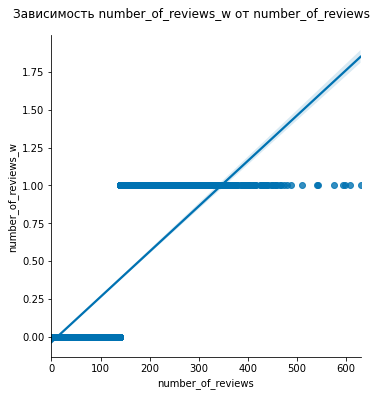

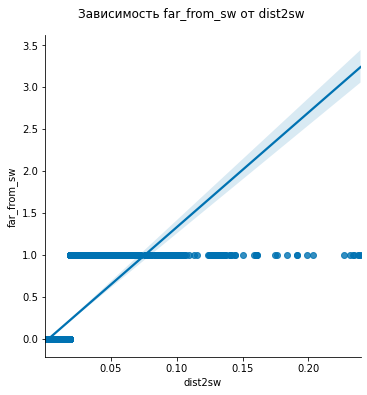

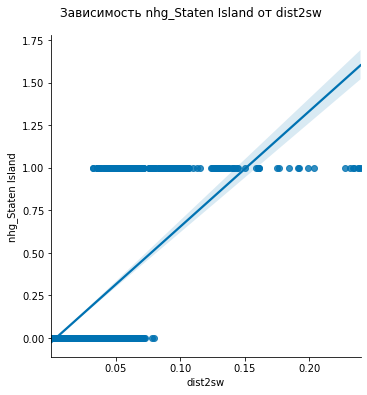

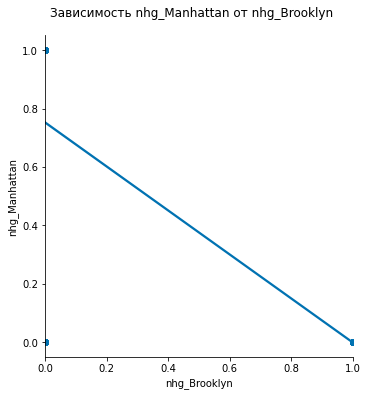

In [76]:
plot_correlations(corr_pairs, data=data_prep)

<a id="utils"></a>
# Утилиты [⇑](#toc)

In [77]:
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, ElasticNetCV, ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import QuantileTransformer, FunctionTransformer
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, OneHotEncoder, LabelEncoder, PolynomialFeatures
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
import category_encoders as ce

<a id="feat_names"></a>
### Извлечение названий признаков из препроцессора [⇑](#toc)

In [78]:
def get_feature_names(column_transformer):
    """
    Get feature names from all transformers.
    https://johaupt.github.io/scikit-learn/tutorial/python/data%20processing/ml%20pipeline/model%20interpretation/columnTransformer_feature_names.html
    
    Returns
    -------
    feature_names : list of strings
        Names of the features produced by transform.
    """
    # Remove the internal helper function
    #check_is_fitted(column_transformer)
    
    # Turn loopkup into function for better handling with pipeline later
    def get_names(trans):
        # >> Original get_feature_names() method
        if trans == 'drop' or (
                hasattr(column, '__len__') and not len(column)):
            return []
        if trans == 'passthrough':
            if hasattr(column_transformer, '_df_columns'):
                if ((not isinstance(column, slice))
                        and all(isinstance(col, str) for col in column)):
                    return column
                else:
                    return column_transformer._df_columns[column]
            else:
                indices = np.arange(column_transformer._n_features)
                return ['x%d' % i for i in indices[column]]
        if not hasattr(trans, 'get_feature_names'):
        # >>> Change: Return input column names if no method avaiable
            # Turn error into a warning
            warnings.warn("Transformer %s (type %s) does not "
                                 "provide get_feature_names. "
                                 "Will return input column names if available"
                                 % (str(name), type(trans).__name__))
            # For transformers without a get_features_names method, use the input
            # names to the column transformer
            if column is None:
                return []
            else:
                return [name + "__" + f for f in column]

        return [name + "__" + f for f in trans.get_feature_names()]
    
    ### Start of processing
    feature_names = []
    
    # Allow transformers to be pipelines. Pipeline steps are named differently, so preprocessing is needed
    if type(column_transformer) == Pipeline:
        l_transformers = [(name, trans, None, None) for step, name, trans in column_transformer._iter()]
    else:
        # For column transformers, follow the original method
        l_transformers = list(column_transformer._iter(fitted=True))
    
    
    for name, trans, column, _ in l_transformers: 
        if type(trans) == Pipeline:
            # Recursive call on pipeline
            _names = get_feature_names(trans)
            # if pipeline has no transformer that returns names
            if len(_names)==0:
                _names = [name + "__" + f for f in column]
            feature_names.extend(_names)
        else:
            feature_names.extend(get_names(trans))
    
    return np.array(feature_names)

<a id="metrics"></a>
### Метрики [⇑](#toc)

In [79]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, median_absolute_error

<a id="adjr2"></a>
#### Скорректированный (adjusted) R<sup>2</sup> [⇑](#toc)

Так как я собираюсь экспериментировать с добавлением новых признаков, а также с различными способами борьбы с выбросами,<br>
то сравниваться будут модели с различным числом признаков и количеством измерений.<br>
Для такого рода сравнений использование обычной метрики R<sup>2</sup> некорректно, так как она зависит от этих параметров.<br>
Поэтому буду использовать <a href="https://en.wikipedia.org/wiki/Coefficient_of_determination#Adjusted_R2">скорректированную метрику</a>, лишенную этих недостатков.<br>

${\bar{R}}^2=1-(1-R^2)\frac{samples-1}{samples-features-1}$



In [80]:
def adj_r2_score(y_true, y_pred, features):
    """
    Вычисляет скорректированную метрику R^2.
    
    Параметры
    ---------
    y_true : array-like
             Истинные значения целевой переменной.
    y_pred : array-like
             Предсказанные значения целевой переменной.
    features : int
             Количество признаков используемых моделью.
    """
    
    samples = y_true.shape[0]
    r2  = r2_score(y_true, y_pred)

    return 1-(1-r2)*(samples-1)/(samples-features-1)

In [81]:
def float_fmt(flt):
    """Форматирует вывод вещественных чисел с тремя знаками после запятой"""
    return f'{flt:.3f}'

def print_strata(train, test, feat):
    rrr = [f'{a}    {b}' for a, b in zip(train[feat].value_counts(normalize=True).to_string(float_format=float_fmt).split('\n'),
                                         test[feat].value_counts(normalize=True).to_string(float_format=float_fmt).split('\n'))]
    print(f'Тренировочная            Тестовая\n---------------------    ---------------------')
    print('\n'.join(rrr))

def metrics(y_true, y_pred, estimator, round=True, decimals=4):
    if type(estimator) is Pipeline:
        pp = estimator.named_steps['pp']
        if isinstance(pp, ColumnTransformer) != True:
            pp = pp.named_steps['fs']
        features = len(get_feature_names(pp))
    else:
        features = estimator
   
    # При некоторых наборах параметров получается бесконечное предсказание.
    y_pred[np.isposinf(y_pred)] = 10000 # Максимальное значение цены
    y_pred[np.isneginf(y_pred)] = 0 # Минимальное значение цены
    
    stats = [
       adj_r2_score(y_true, y_pred, features)
       ,mean_squared_error(y_true, y_pred, squared=False)
       ,mean_absolute_error(y_true, y_pred)
       ,median_absolute_error(y_true, y_pred)
    ]
    
    stats = np.around(stats, decimals=decimals) if round else stats
    
    return { r'${\bar{R}}^2$'    : stats[0]
            ,'RMSE'  : stats[1] 
            ,'MAE'   : stats[2]
            ,'MedAE' : stats[3]}

measured_metrics = pd.DataFrame(index=[
    r'${\bar{R}}^2$'
    ,'RMSE'
    ,'MAE'
    ,'MedAE'
])

measured_metrics['baseline'] = [0,0,0,0]

def clear_metrics():
    measured_metrics = pd.DataFrame(index=[
        r'${\bar{R}}^2$'
        ,'RMSE'
        ,'MAE'
        ,'MedAE'
    ]) 

    measured_metrics['baseline'] = [0,0,0,0]

def show_metrics(sortBy='RMSE'):
    display(measured_metrics.T.sort_values(by=sortBy, ascending=True).style.format('{:.4f}'))
    
def get_current_best(sortBy='RMSE'):
    leader = measured_metrics.T.sort_values(by=sortBy, ascending=True).iloc[0]
    diff_metrics = pd.DataFrame(index=[
        r'${\bar{R}}^2$'
        ,'RMSE'
        ,'MAE'
        ,'MedAE'
    ])
    
    diff_metrics['Предыдущий лидер'] = leader
    
    return diff_metrics

def show_current_best(metrics):
    def highlight_best_score(data):
        attr = 'color: green'
    
        if data.name == r'${\bar{R}}^2$':
            is_best = data == data.max()
        else:
            is_best = data == data.min()

        return [attr if v else '' for v in is_best]
    
    display(metrics.T.style.format('{:.4f}').apply(highlight_best_score))

<a id="feat_importance"></a>
### Визуализация важности признаков  [⇑](#toc)

In [82]:
def plot_feature_importance(estimators, name='LassoCV', drop_threshold=None):
    """
    Визуализирует важность признаков для заданной модели.
    По умолчанию для визуализации используется LassoCV, 
    так как эта модель умеет обнулять коэффициенты неважных признаков.
    
    Параметры
    ---------
    estimators : массив кортежей вида (name, pipeline)
        Из этого массива выбирается модель, по которой будет
        визуализирована важность признаков.
        Предполагается, что шаг, в котором находится модель, называется ml.
        
    name : str
        Имя модели, по которой визуализировать важность признаков.
        По умолчанию 'LassoCV'.
        
    drop_threshold : number
        Порог абсолютного значения важности признака для его выброса из модели.
        Сначала выброшенными считаются признаки с нулевым коэффициентом в модели (в Lasso и ElasticNet).
        Если после первого шага найдены выброшенные признаки, то порог не используется.
        Если признаков с нулевыми коэффициентами нет, то выброшенными считаются все признаки, для которых
        абсолютное значение коэфиициента в модели меньше этого порога.
    """
    pipeline    = next(regressor for regressor in estimators if regressor[0] == name)[1]

    regressor   = pipeline.named_steps['ml']
   
    if type(regressor) is TransformedTargetRegressor:
        regressor = regressor.regressor_

    transformer = pipeline.named_steps['pp']
    
    if isinstance(transformer, ColumnTransformer) != True:
        transformer = transformer.named_steps['fs']
    
    #if type(transformer) is Pipeline:
    #    transformer = transformer.named_steps['fs']
   
    features = get_feature_names(transformer)
    
    drop_mask = regressor.coef_ == 0
    
    if sum(drop_mask) == 0 and (drop_threshold is not None):
        drop_mask = np.abs(regressor.coef_) < drop_threshold
    
    featureImportance = pd.DataFrame({'Признак': features[~drop_mask], 
                                      "Важность": regressor.coef_[~drop_mask]})

    featureImportance.set_index('Признак', inplace=True)
    featureImportance.sort_values(["Важность"], ascending=False, inplace=True)
    
    dropped_features = features[drop_mask]
   
    fig, ax = plt.subplots(figsize=(22, 8))
    
    sns.barplot(y=featureImportance['Важность'], x=featureImportance.index, data=featureImportance, ax=ax)
   
    if len(dropped_features) > 0:
        extra = plt.Rectangle((0, 0), 0, 0, fc="w", fill=False, edgecolor='none', linewidth=0)
        plt.legend(labels=dropped_features
                   ,title='Выброшенные признаки'
                   ,loc='upper center', bbox_to_anchor=(0.5, -0.5)
                   ,ncol=6
                   ,borderaxespad=0.
                   ,fancybox=True
                   ,handletextpad=0, handlelength=0
                  )

    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', labelrotation=90)
    
    plt.title(f'Важность признаков {name}')
    plt.show()

    return dropped_features

<a id="mlplot"></a>
### Визуализация результатов моделирования [⇑](#toc)

In [83]:
from tqdm.auto import tqdm # Не работает в JupyterLab без node.js версии < 10
#from tqdm import tqdm # Работает в JupyterLab

def plot_regression_results(ax, y_true, y_pred, title, scores):
    """
    Scatter plot of the predicted vs true targets.
    https://scikit-learn.org/stable/auto_examples/ensemble/plot_stack_predictors.html#measure-and-plot-the-results
    """
    ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], '--r', linewidth=2)
    ax.scatter(y_true, y_pred, alpha=0.2)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.set_xlim([y_true.min(), y_true.max()])
    ax.set_ylim([y_true.min(), y_true.max()])
    ax.set_xlabel('Измерение')
    ax.set_ylabel('Предсказание')
    ax.legend(labels=[scores], loc='upper left', borderaxespad=0., fancybox=True, handletextpad=0, handlelength=0)
    ax.set_title(title)

def plot_results(title, estimators, X_train, X_test, y_train, y_test, show_plot=False):
    """
    Считает метрики и визуализирует результаты моделирования заданными моделями.
    
    Параметры
    ---------
    title : str
            Название эксперимента.
            
    estimators : массив кортежей вида (name, pipeline)
            Список моделей.
    
    X_train : dataframe-like
            Тренировочная выборка.
            
    X_test : dataframe-like
            Тестовая выборка.
            
    y_train : array-like
            Тренировочные метки.
            
    y_test : array-like
            Тестовые метки.
    """
    fig, axs = plt.subplots(2, 2, figsize=(9, 7), dpi=300)
    axs = np.ravel(axs)

    diff_metrics = get_current_best()
    
    progress = tqdm(zip(axs, estimators), total=len(estimators), position=0)
    for ax, (name, estimator) in progress:
        progress.set_postfix_str(name)
        estimator.fit(X_train, y_train)
        y_pred = estimator.predict(X_test)
        score = metrics(y_test, y_pred, estimator)
        diff_metrics[name] = score.values()
        measured_metrics[f'{title} {name}'] = score.values()
        if show_plot:
            adjR2 = score[r'${\bar{R}}^2$']
            score_text = (  r'${\bar{R}}^2$' + f'  = {adjR2:.3f}'
                         + f'\nRMSE = {score["RMSE"]:.3f}'
                         + f'\nMAE  = {score["MAE"]:.3f}'
                         + f'\nMedAE  = {score["MedAE"]:.3f}')

            plot_regression_results(
                ax, y_test, y_pred,
                name,
                score_text
            )
            
    show_current_best(diff_metrics)
       
    if show_plot:
        plt.suptitle(title)
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()
    
    plt.close(fig)
    
def naive_baseline(y_true, y_const, features=7, name='baseline'):
    """
    Считает метрики для модели, всегда предсказывающей константное значение.
    
    Параметры
    ---------
    y_true : array_like
             Массив значений целевой переменной.
             
    y_const: number
             Константное предсказание наивной модели.
    """
    y_naive = np.ones(len(y_true)) * y_const
    score = metrics(y_true, y_naive, features) # 7 - число численных признаков в исходных данных.
    measured_metrics[name] = score.values()
    adjR2 = score[r'${\bar{R}}^2$']
    score_text = (   r'${\bar{R}}^2$' + f'  = {adjR2:.3f}'
                  + f'\nRMSE = {score["RMSE"]:.3f}'
                  + f'\nMAE  = {score["MAE"]:.3f}'
                  + f'\nMedAE  = {score["MedAE"]:.3f}')

    fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=100)
    plot_regression_results(ax, y_true, y_naive, 'Точка отсчёта', score_text)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

<a id="pipes"></a>
### Генератор моделей [⇑](#toc)

In [84]:
from IPython.display import display
from sklearn import set_config
set_config(display='diagram')

class ColumnTransformerDf(ColumnTransformer):
    def __init__(self, transformers, remainder='passthrough', n_jobs=-1, verbose=False):
        super(ColumnTransformerDf, self).__init__(transformers=transformers, remainder=remainder, n_jobs=n_jobs, verbose=verbose)

    def fit_transform(self, X, y=None):
        z = super(ColumnTransformerDf, self).fit_transform(X, y)
        c=get_feature_names(self)
        return pd.DataFrame(z, index=X.index, columns=c)

def get_estimators(transform_target=None,
                   log_transform_feat=False,
                   add_mh_dist=False,
                   add_metro_dist=False,
                   no_coords=False,
                   scaler='std',
                   no_cats=False,
                   cats_mode='ohe',
                   ohe_drop=None,
                   dropped_feats=None,
                   add_w_flags=False,
                   add_sw_farness=False,
                   add_avialable=False,
                   verbose=False,
                   explain_pipeline=True,
                   explain_type='diagram'):

    def get_numeric_transformer():
        steps = []
        if log_transform_feat:
            steps.append(('log', FunctionTransformer(np.log1p)))
        
        if scaler=='robust':
            steps.append(('scaler', RobustScaler()))
        elif scaler=='std':
            steps.append(('scaler', StandardScaler()))
        elif scaler=='mm':
            steps.append(('scaler', MinMaxScaler()))
        
        return 'passthrough' if len(steps) == 0 else Pipeline(steps=steps, verbose=verbose)
    
    def get_coords_transformer():
        steps = []

        if scaler=='robust':
            steps.append(('scaler', RobustScaler()))
        elif scaler=='std':
            steps.append(('scaler', StandardScaler()))
        
        return 'passthrough' if len(steps) == 0 else Pipeline(steps=steps, verbose=verbose)
    
    def get_categorical_transformer():
        if cats_mode == 'catboost':
            return ce.CatBoostEncoder(cols=cats, random_state=random_state)
        else:
            return OneHotEncoder(sparse=False, drop=ohe_drop, dtype=np.int32, handle_unknown='ignore')
    
    def get_preprocessor():
        transformers=[]
        
        nums_copy = nums.copy()
        
        if add_mh_dist==True:
            nums_copy.append('dist2mh')
            
        if add_metro_dist==True:
            nums_copy.append('dist2sw')
            
        transformers.append(('nums', get_numeric_transformer(), nums_copy))
        
        if no_cats==False:
            transformers.append(('cats', get_categorical_transformer(), cats))
        
        if no_coords==False:
            transformers.append(('coords', get_coords_transformer(), coords))
            
        if add_w_flags==True:
            transformers.append(('windsored', 'passthrough', windsored_cols))
            
        if add_sw_farness==True:
            transformers.append(('far_from_sw', 'passthrough', ['far_from_sw']))
            
        if add_avialable==True:
            transformers.append(('avialable', 'passthrough', ['avialable']))
        
        pp = ColumnTransformerDf(transformers=transformers, remainder='drop', verbose=verbose)
        
        if (dropped_feats is not None) and len(dropped_feats) > 0:
            fs = ColumnTransformer([('feature_selection', 'drop', lambda l : np.isin(get_feature_names(pp), dropped_feats))],
                                   remainder='passthrough', n_jobs=-1, verbose=verbose)
            #fs = ColumnTransformer([('feature_selection', 'drop', dropped_feats)], remainder='passthrough', verbose=verbose)
            return Pipeline([
                ('fp', pp),
                ('fs', fs)
            ])
        else:
            return pp;
   
    def get_regressor(regressor):
        if transform_target=='log':
            return TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)
        elif transform_target=='norm':
            return TransformedTargetRegressor(regressor=regressor, transformer=QuantileTransformer(output_distribution='normal', random_state=random_state))
        else:
            return regressor
    
    lr = Pipeline([
        ("pp", get_preprocessor()),
        ("ml", get_regressor(LinearRegression()))
    ])

    ridge = Pipeline([
        ("pp", get_preprocessor()),
        ("ml", get_regressor(RidgeCV()))
    ])

    lasso = Pipeline([
        ("pp", get_preprocessor()),
        ("ml", get_regressor(LassoCV()))
    ])

    elastic = Pipeline([
        ("pp", get_preprocessor()),
        ("ml", get_regressor(ElasticNetCV()))
    ])
    
    if explain_pipeline == True:
        if explain_type == 'text':
            print(elastic)
        else:
            display(elastic)

    return [('LinearRegression', lr), ('RidgeCV', ridge), ('LassoCV', lasso), ('ElasticNetCV', elastic)]

<a id="ml"></a>
# Моделирование [⇑](#toc)

In [85]:
X = data.drop(['price'], axis=1) 
y = data['price']
test_size = 0.3

In [86]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

<a id="outliers"></a>
## Моделирование с выбросами [⇑](#toc)

В данных много выбросов, что для линейных моделей, использующих расстоянием между признаками полохо.<br>
Ещё раз подтверждая очевидное обучу модели на данных без обработки выбросов.

In [87]:
estimators = get_estimators(cats_mode='catboost', log_transform_feat=True)
plot_results('С выбросами', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365']),
                                                   ('cats',
                                                    CatBoostEncoder(cols=['neighbourhood_group',
                                                                          'room_type',
                                                                          'neighbourhood'],
                                                                    random_state=42),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.0000,0.0000,0.0000,0.0000
LinearRegression,0.1600,179.0450,70.0796,44.2459
RidgeCV,0.1600,179.0450,70.0762,44.2409
LassoCV,0.1565,179.4094,68.4001,41.5706
ElasticNetCV,0.1380,181.3666,68.8919,41.5434


Что и требовалось доказать — метрики ужасные.

<a id="dropout"></a>
## Удаление выбросов [⇑](#toc)

In [88]:
outless = data[~price_out_index]
outless = outless[~minimum_nights_out_index]
outless = outless[~number_of_reviews_out_index]
outless = outless[~reviews_per_month_out_index]
outless = outless[~calculated_host_listings_count_out_index]
outless.describe(percentiles=[.25, .5, .75, .95, .99]).T

,count,mean,std,min,25%,50%,75%,95%,99%,max
latitude,42456.0,40.729343,0.055694,40.499790,40.688837,40.721035,40.763550,40.827323,40.865542,40.913059
longitude,42456.0,-73.966354,0.048725,-74.244423,-73.981720,-73.954453,-73.935013,-73.863487,-73.774461,-73.712990
price,42456.0,134.033399,97.628057,10.000000,69.000000,100.000000,170.000000,325.000000,500.000000,700.000000
minimum_nights,42456.0,4.629240,6.679215,1.000000,1.000000,2.000000,4.000000,28.000000,30.000000,33.000000
number_of_reviews,42456.0,18.070355,28.003567,0.000000,1.000000,5.000000,22.000000,85.000000,125.000000,139.000000
reviews_per_month,42456.0,1.018342,1.420333,0.000000,0.050000,0.370000,1.460000,4.040000,6.190000,9.230000
calculated_host_listings_count,42456.0,1.552713,1.138320,1.000000,1.000000,1.000000,2.000000,4.000000,6.000000,7.000000
availability_365,42456.0,95.099821,123.580252,0.000000,0.000000,23.000000,177.000000,353.250000,365.000000,365.000000
minimum_nights_w,42456.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
number_of_reviews_w,42456.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [89]:
X = outless.drop(['price'], axis=1) 
y = outless['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

<a id="baseline"></a>
## Точка отсчёта [⇑](#toc)

В качестве точки отсчёта использую медианное значение цены.

In [90]:
y_median = np.median(y_train)                   
print(f'Медианное значение цены: {y_median}')

Медианное значение цены: 100.0


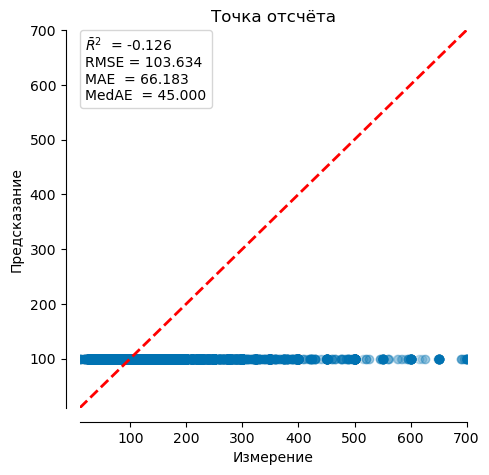

In [91]:
naive_baseline(y_test, y_median)

<a id="nocats"></a>
## Моделирование без учёта категориальных признаков [⇑](#toc)

Выброшу категориальные признаки и посмотрю что получится.

In [92]:
estimators = get_estimators(no_cats=True)
plot_results('NoCats', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,-0.1258,103.6338,66.1827,45.0000
LinearRegression,0.1085,92.2224,65.0256,51.6129
RidgeCV,0.1085,92.2226,65.0254,51.6146
LassoCV,0.1084,92.2236,65.0250,51.6256
ElasticNetCV,0.1081,92.2409,65.0179,51.7867


<a id="cats"></a>
## Моделирование с категориальными признаками [⇑](#toc)

<a id="ohe"></a>
### OneHotEncoder [⇑](#toc)

In [93]:
estimators = get_estimators(cats_mode='ohe')
plot_results('OHE', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.1085,92.2224,65.0256,51.6129
LinearRegression,-33739861402.5761,17782096.2643,385992.2397,32.2266
RidgeCV,0.4135,74.1367,47.4852,32.0714
LassoCV,0.4124,74.2097,47.4758,32.0056
ElasticNetCV,0.3891,75.6675,48.3589,32.8851


<a id="catboost"></a>
### CatBoostEncoder [⇑](#toc)

In [94]:
estimators = get_estimators(cats_mode='catboost')
plot_results('CatBoost', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365']),
                                                   ('cats',
                                                    CatBoostEncoder(cols=['neighbourhood_group',
                                                                          'room_type',
                                                                          'neighbourhood'],
                                                                    random_state=42),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4135,74.1367,47.4852,32.0714
LinearRegression,0.4192,74.4272,47.4642,31.7233
RidgeCV,0.4192,74.4273,47.4634,31.7171
LassoCV,0.4146,74.7209,47.1796,30.8128
ElasticNetCV,0.3947,75.9797,47.7705,30.5812


In [95]:
#Лучше всего получилось с OneHotEncoder'ом - его и буду использовать дальше.
best_cats_mode = 'ohe'

<a id="add_geo"></a>
## Моделирование с добавлением географических признаков [⇑](#toc)

<a id="add_manh"></a>
### Расстояние до Манхэттена [⇑](#toc)

In [96]:
estimators = get_estimators(add_mh_dist=True, cats_mode=best_cats_mode)
plot_results('Расстояние до Манхэттена', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4135,74.1367,47.4852,32.0714
LinearRegression,-213798356607258464.0000,44760623311.4476,971489693.8712,32.3281
RidgeCV,0.4138,74.1152,47.4771,32.1839
LassoCV,0.4123,74.2144,47.4882,32.1055
ElasticNetCV,0.3937,75.3792,48.2782,33.0659


<a id="add_metro"></a>
### Расстояние до метро [⇑](#toc)

In [97]:
estimators = get_estimators(add_metro_dist=True, cats_mode=best_cats_mode)
plot_results('Расстояние до метро', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4138,74.1152,47.4771,32.1839
LinearRegression,-77583724672272944.0000,26963685757.9445,585222942.2222,32.3203
RidgeCV,0.4135,74.1367,47.4851,32.0671
LassoCV,0.4123,74.2128,47.4779,32.0473
ElasticNetCV,0.3911,75.5374,48.3294,32.9520


<a id="add_swmh"></a>
### Метро+Манхэттен [⇑](#toc)

In [98]:
estimators = get_estimators(add_mh_dist=True, add_metro_dist=True, cats_mode=best_cats_mode)
plot_results('Метро+Манхэттен', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4138,74.1152,47.4771,32.1839
LinearRegression,-34000403588467236.0000,17849194150.7511,387400982.3815,32.2656
RidgeCV,0.4138,74.1140,47.4806,32.1893
LassoCV,0.4121,74.2200,47.4959,32.1808
ElasticNetCV,0.3937,75.3741,48.2758,33.0626


Оба новых признака вместе дают улучшение. Дальше идём с двумя.

<a id="nocoords"></a>
### Метро+Манхэттен без координат в явном виде [⇑](#toc)

In [99]:
estimators = get_estimators(no_coords=True, add_mh_dist=True, add_metro_dist=True, cats_mode=best_cats_mode)
plot_results('Без координат', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4138,74.1140,47.4806,32.1893
LinearRegression,-2076525249778512128.0000,139501834259.5108,3027763684.3215,32.2188
RidgeCV,0.4133,74.1539,47.5222,32.1295
LassoCV,0.4119,74.2420,47.5051,32.2311
ElasticNetCV,0.3883,75.7122,48.3819,32.8955


Тут непонятно, с одной стороны ухудшение RMSE во втором знаке, с другой стороны улучшение MAE на пару единиц.

<a id="scaling"></a>
## Масштабирование признаков [⇑](#toc)

<a id="noscale"></a>
### Без масштабирования признаков [⇑](#toc)

In [100]:
estimators = get_estimators(scaler=None, add_mh_dist=True, add_metro_dist=True, cats_mode=best_cats_mode)
plot_results('NoScale', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums', 'passthrough',
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords', 'passthrough',
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4138,74.1140,47.4806,32.1893
LinearRegression,-3911501864702.6064,191446904.3157,4155232.9463,32.2496
RidgeCV,0.4130,74.1645,47.5526,32.1678
LassoCV,0.3678,76.9662,49.3991,33.5891
ElasticNetCV,0.1836,87.4626,59.8410,46.5858


<a id="znorm"></a>
### Масштабирование StandardScaler'ом [⇑](#toc)

In [101]:
estimators = get_estimators(scaler='std', add_mh_dist=True, add_metro_dist=True, cats_mode=best_cats_mode)
plot_results('Standard', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4138,74.1140,47.4806,32.1893
LinearRegression,-34000403588467236.0000,17849194150.7511,387400982.3815,32.2656
RidgeCV,0.4138,74.1140,47.4806,32.1893
LassoCV,0.4121,74.2200,47.4959,32.1808
ElasticNetCV,0.3937,75.3741,48.2758,33.0626


<a id="rnorm"></a>
### Масштабирование RobustScaler'ом [⇑](#toc)

In [102]:
estimators = get_estimators(scaler='robust', add_mh_dist=True, add_metro_dist=True, cats_mode=best_cats_mode)
plot_results('Robust', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     RobustScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     RobustScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4138,74.1140,47.4806,32.1893
LinearRegression,-140564937515.7189,36292349.0672,787740.8766,32.2461
RidgeCV,0.4138,74.1143,47.4801,32.1784
LassoCV,0.4121,74.2203,47.4955,32.1778
ElasticNetCV,0.3934,75.3911,48.2532,33.0973


<a id="mnorm"></a>
### Масштабирование MinMaxScaler'ом [⇑](#toc)

In [103]:
estimators = get_estimators(scaler='mm', add_mh_dist=True, add_metro_dist=True, cats_mode=best_cats_mode)
plot_results('MinMax', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('scaler',
                                                                     MinMaxScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords', 'passthrough',
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4138,74.1140,47.4806,32.1893
LinearRegression,-232502171920876.7500,1476012666.8105,32035593.9838,32.2451
RidgeCV,0.4131,74.1583,47.5622,32.2412
LassoCV,0.4119,74.2335,47.4700,32.0555
ElasticNetCV,0.3829,76.0451,48.2184,32.1619


In [104]:
best_scaler = 'std'

<a id="log"></a>
## Логарифмирование признаков [⇑](#toc)

In [105]:
estimators = get_estimators(log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Log', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml', ElasticNetCV())])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4138,74.1140,47.4806,32.1893
LinearRegression,-662560031873055.8750,2491662376.1322,54079370.3552,31.8125
RidgeCV,0.4184,73.8194,47.3513,31.5410
LassoCV,0.4171,73.9061,47.3645,31.4758
ElasticNetCV,0.3993,75.0248,48.0824,32.7172


<a id="target_transform"></a>
### Трансформация целевой переменной [⇑](#toc)

<a id="tt_log"></a>
#### Логарифмирование целевой переменной [⇑](#toc)

In [106]:
estimators = get_estimators(transform_target='log', log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('TTlog+Log+Std', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,-4.4871,226.7501,48.1835,24.1938
RidgeCV,0.4123,74.2087,43.5417,24.1207
LassoCV,0.4078,74.4949,43.6603,24.4082
ElasticNetCV,0.4073,74.5262,43.6616,24.3805


<a id="tt_norm"></a>
#### Нормализация целевой переменной [⇑](#toc)

In [107]:
estimators = get_estimators(transform_target='norm', log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('TTnorm+Log+Std', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml',
                 TransformedTargetRegressor(regressor=ElasticNetCV(),
                                            transformer=QuantileTransformer(output_distribution='normal',
                                                                            random_state=42)))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.3946,75.3174,43.8153,25.0000
RidgeCV,0.4114,74.2681,43.5407,25.0000
LassoCV,0.4067,74.5615,43.6034,25.0000
ElasticNetCV,0.4061,74.5988,43.6183,25.0000


Логарифмирование целевой переменной незначительно ухудшает RMSE, но заметно улучшает MAE и, особенно MedAE.

In [108]:
best_transform_target='log'

<a id="stratum"></a>
### Cтратификация [⇑](#toc)

In [109]:
print('Распределение долей категории neighbourhood_group по выборкам\n')
print_strata(X_train, X_test, 'neighbourhood_group')
print('\nРаспределение долей категории room_type по выборкам\n')
print_strata(X_train, X_test, 'room_type')

Распределение долей категории neighbourhood_group по выборкам

Тренировочная            Тестовая
---------------------    ---------------------
Brooklyn        0.432    Brooklyn        0.433
Manhattan       0.419    Manhattan       0.419
Queens          0.118    Queens          0.115
Bronx           0.024    Bronx           0.023
Staten Island   0.007    Staten Island   0.010

Распределение долей категории room_type по выборкам

Тренировочная            Тестовая
---------------------    ---------------------
Entire home/apt   0.507    Entire home/apt   0.513
Private room      0.470    Private room      0.466
Shared room       0.023    Shared room       0.021


Без стратификации распределение долей категориальных переменных неравномерная.<br>
Попробуем стратифицировать разбиение.

<a id="strat_neig"></a>
#### Cтратификация по neighbourhood_group [⇑](#toc)

In [110]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=outless['neighbourhood_group'])
print_strata(X_train, X_test, 'neighbourhood_group')

Тренировочная            Тестовая
---------------------    ---------------------
Brooklyn        0.432    Brooklyn        0.432
Manhattan       0.419    Manhattan       0.419
Queens          0.117    Queens          0.117
Bronx           0.024    Bronx           0.024
Staten Island   0.008    Staten Island   0.008


In [111]:
estimators = get_estimators(transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Cтратификация по neighbourhood_group', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,-1.2304,143.8057,45.1095,24.1358
RidgeCV,0.4091,74.0184,43.5344,24.0970
LassoCV,0.4036,74.3625,43.6752,24.3447
ElasticNetCV,0.4027,74.4194,43.6969,24.3424


<a id="strat_room"></a>
#### Cтратификация по room_type [⇑](#toc)

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=outless['room_type'])
print_strata(X_train, X_test, 'room_type')

Тренировочная            Тестовая
---------------------    ---------------------
Entire home/apt   0.509    Entire home/apt   0.509
Private room      0.469    Private room      0.469
Shared room       0.022    Shared room       0.022


In [113]:
estimators = get_estimators(transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Cтратификация по room_type', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.3914,76.2258,44.5489,24.5965
RidgeCV,0.3916,76.2121,44.5206,24.5965
LassoCV,0.3864,76.5346,44.6346,24.6156
ElasticNetCV,0.3857,76.5827,44.6544,24.6673


<a id="strat_neighbourhood"></a>
#### Cтратификация по neighbourhood [⇑](#toc)

Есть несколько категорий <b>neighbourhood</b>, для которых только по одному измерению в наборе данных.<br>
Так как для стратификации необходимо хотя бы два измерения в каждой категории, то просто удалю эти одинарные измерения.<br>

In [114]:
single_nh = np.array(outless['neighbourhood'].value_counts()[outless['neighbourhood'].value_counts() == 1].index)
single_nh

array(['NewDorp', 'CoopCity', 'Woodrow', 'Willowbrook', 'Richmondtown',
       'Rossville', 'Eastchester', 'SilverLake'], dtype=object)

Предположу, что удаление шести измерений из ~49 тысяч не повлияет на качество модели.

In [115]:
data_copy = outless[~outless['neighbourhood'].isin(single_nh)]
X_train, X_test, y_train, y_test = train_test_split(data_copy.drop(['price'], axis=1) , data_copy['price'], test_size=test_size, random_state=random_state, stratify=data_copy['neighbourhood'])

In [116]:
estimators = get_estimators(transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Cтратификация по neighbourhood', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude',
                                                     'longitude'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.4016,74.8779,43.8715,24.3274
RidgeCV,0.4017,74.8719,43.8577,24.3111
LassoCV,0.3952,75.2766,43.9871,24.3524
ElasticNetCV,0.3944,75.3251,43.9989,24.3383


На мой взгляд лучший вариант это вариант со стратификацией по <b>neighbourhood_group</b> и логарифмированием целевой переменной.<br>
Так как RMSE и улучшенный $R^2$ незначительно хуже предыдущего победителя, но при этом MAE и MedAE заметно лучше.<br>
Продолжу дальше с ним.

In [117]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=outless['neighbourhood_group'])

<a id="sw_farness"></a>
### Признак удалённости от метро [⇑](#toc)

Теперь попробую добавить признак удалённости от метро, полученный на основе пометки выбросов по признаку <b>dist2sw</b>.<br>
При этом сами выбросы я удалял из набора данных.

In [118]:
estimators = get_estimators(add_sw_farness=True, transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Признак удалённости от метро', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.int32'>,
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude', 'longitude']),
                                                   ('far_from_sw',
                                                    'passthrough',
                                                    ['far_from_sw'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,-4.5540,226.9190,48.1817,24.1297
RidgeCV,0.4096,73.9818,43.5252,24.0968
LassoCV,0.4043,74.3180,43.6508,24.3170
ElasticNetCV,0.4034,74.3738,43.6728,24.3423


<a id="avialableness"></a>
### Признак доступности [⇑](#toc)

Теперь добавлю признак доступности апартаментов, полученный на основе признака <b>availability_365</b> со значением большим нуля.<br>

In [119]:
estimators = get_estimators(add_avialable=True, add_sw_farness=True, transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Признак доступности', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.i...
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude', 'longitude']),
                                                   ('far_from_sw',
                                                    'passthrough',
                                                    ['far_from_sw']),
                                                   ('avialable', 'passthrough',
                                                    ['avialable'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.4099,73.9647,43.5376,24.1598
RidgeCV,0.4107,73.9102,43.4812,24.1222
LassoCV,0.4052,74.2581,43.6143,24.3686
ElasticNetCV,0.4043,74.3154,43.6367,24.3641


## Лучший вариант с удалением выбросов

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.i...
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude', 'longitude']),
                                                   ('far_from_sw',
                                                    'passthrough',
                                                    ['far_from_sw']),
                                                   ('avialable', 'passthrough',
                                                    ['avialable'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.4099,73.9647,43.5376,24.1598
RidgeCV,0.4107,73.9102,43.4812,24.1222
LassoCV,0.4052,74.2581,43.6143,24.3686
ElasticNetCV,0.4043,74.3154,43.6367,24.3641


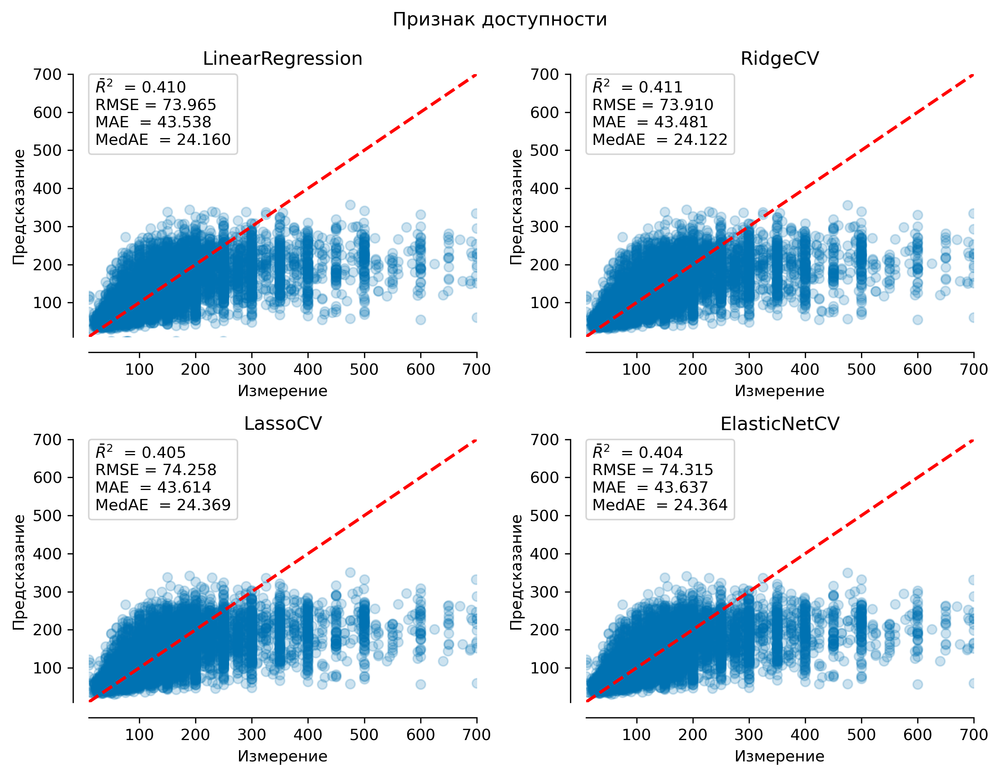

In [120]:
estimators = get_estimators(add_avialable=True, add_sw_farness=True, transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Признак доступности', estimators, X_train, X_test, y_train, y_test, show_plot=True)

<a id="windsor"></a>
## Виндзоризация выбросов [⇑](#toc)

In [121]:
def impute_outlier_with_arbitrary(data, outlier_index, value, col=None):
    """Заменяем выбросы значением ``value``."""
    col = col or []
    data_copy = data.copy(deep=True)
    for i in col:
        data_copy.loc[outlier_index,i] = value
    return data_copy

С выбросами целевой переменной я ничего не могу поделать, поэтому удаляю их.

In [122]:
windsored = data[~price_out_index]

А остальные признаки с выбросами трансформирую таким образом, что все выбросы заменю на рассчитанную методом интерквартильного расстояния верхнюю границу.

In [123]:
windsored = impute_outlier_with_arbitrary(windsored, minimum_nights_out_index, minimum_nights_out_up, ['minimum_nights'])
windsored = impute_outlier_with_arbitrary(windsored, number_of_reviews_out_index, number_of_reviews_out_up, ['number_of_reviews'])
windsored = impute_outlier_with_arbitrary(windsored, reviews_per_month_out_index, reviews_per_month_out_up, ['reviews_per_month'])
windsored = impute_outlier_with_arbitrary(windsored, calculated_host_listings_count_out_index, calculated_host_listings_count_out_up, ['calculated_host_listings_count_'])
outless.describe(percentiles=[.25, .5, .75, .95, .99]).T

,count,mean,std,min,25%,50%,75%,95%,99%,max
latitude,42456.0,40.729343,0.055694,40.499790,40.688837,40.721035,40.763550,40.827323,40.865542,40.913059
longitude,42456.0,-73.966354,0.048725,-74.244423,-73.981720,-73.954453,-73.935013,-73.863487,-73.774461,-73.712990
price,42456.0,134.033399,97.628057,10.000000,69.000000,100.000000,170.000000,325.000000,500.000000,700.000000
minimum_nights,42456.0,4.629240,6.679215,1.000000,1.000000,2.000000,4.000000,28.000000,30.000000,33.000000
number_of_reviews,42456.0,18.070355,28.003567,0.000000,1.000000,5.000000,22.000000,85.000000,125.000000,139.000000
reviews_per_month,42456.0,1.018342,1.420333,0.000000,0.050000,0.370000,1.460000,4.040000,6.190000,9.230000
calculated_host_listings_count,42456.0,1.552713,1.138320,1.000000,1.000000,1.000000,2.000000,4.000000,6.000000,7.000000
availability_365,42456.0,95.099821,123.580252,0.000000,0.000000,23.000000,177.000000,353.250000,365.000000,365.000000
minimum_nights_w,42456.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
number_of_reviews_w,42456.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [124]:
X = windsored.drop(['price'], axis=1) 
y = windsored['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=windsored['neighbourhood_group'])

<a id="no_w_mark"></a>
### Без разметки заменённых выбросов [⇑](#toc)

In [125]:
estimators = get_estimators(add_w_flags=False, add_avialable=True, add_sw_farness=True, transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Виндзоризация без разметки', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.i...
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude', 'longitude']),
                                                   ('far_from_sw',
                                                    'passthrough',
                                                    ['far_from_sw']),
                                                   ('avialable', 'passthrough',
                                                    ['avialable'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.4136,76.3618,44.7951,24.6916
RidgeCV,0.4142,76.3207,44.7662,24.7743
LassoCV,0.4084,76.6997,44.9966,25.0155
ElasticNetCV,0.4076,76.7472,45.0179,25.0535


<a id="with_w_mark"></a>
### C разметкой заменённых выбросов [⇑](#toc)

In [126]:
estimators = get_estimators(add_w_flags=True, add_avialable=True, add_sw_farness=True, transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Виндзоризация с разметкой', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.i...
                                                    ['latitude', 'longitude']),
                                                   ('windsored', 'passthrough',
                                                    ['minimum_nights_w',
                                                     'number_of_reviews_w',
                                                     'reviews_per_month_w',
                                                     'calculated_host_listings_count_w']),
                                                   ('far_from_sw',
                                                    'passthrough',
                                                    ['far_from_sw']),
                                                   ('avialable', 'passthrough',
                                                    ['avialable'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,-5.0299,244.8290,50.1517,24.6662
RidgeCV,0.4151,76.2515,44.7123,24.7301
LassoCV,0.4089,76.6550,44.9572,24.9230
ElasticNetCV,0.4081,76.7040,44.9781,24.9519


Виндзоризация оказалась хуже.

<a id="interpretation"></a>
# Интерпретация моделей (важность признаков) [⇑](#toc)

In [127]:
outless = data[~price_out_index]
outless = outless[~minimum_nights_out_index]
outless = outless[~number_of_reviews_out_index]
outless = outless[~reviews_per_month_out_index]
outless = outless[~calculated_host_listings_count_out_index]

X = outless.drop(['price'], axis=1) 
y = outless['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=outless['neighbourhood_group'])

estimators = get_estimators(add_avialable=True, add_sw_farness=True, transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Признак доступности', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 ColumnTransformerDf(remainder='drop',
                                     transformers=[('nums',
                                                    Pipeline(steps=[('log',
                                                                     FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                    ('scaler',
                                                                     StandardScaler())]),
                                                    ['minimum_nights',
                                                     'number_of_reviews',
                                                     'reviews_per_month',
                                                     'calculated_host_listings_count',
                                                     'availability_365',
                                                     'dist2mh', 'dist2sw']),
                                                   ('cats',
                                                    OneHotEncoder(dtype=<class 'numpy.i...
                                                                  handle_unknown='ignore',
                                                                  sparse=False),
                                                    ['neighbourhood_group',
                                                     'room_type',
                                                     'neighbourhood']),
                                                   ('coords',
                                                    Pipeline(steps=[('scaler',
                                                                     StandardScaler())]),
                                                    ['latitude', 'longitude']),
                                                   ('far_from_sw',
                                                    'passthrough',
                                                    ['far_from_sw']),
                                                   ('avialable', 'passthrough',
                                                    ['avialable'])])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.4099,73.9647,43.5376,24.1598
RidgeCV,0.4107,73.9102,43.4812,24.1222
LassoCV,0.4052,74.2581,43.6143,24.3686
ElasticNetCV,0.4043,74.3154,43.6367,24.3641


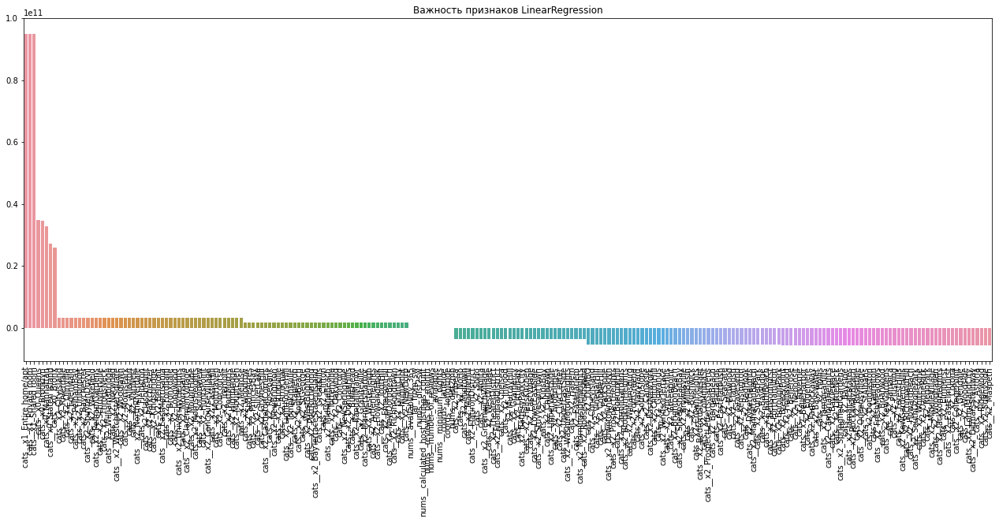

In [128]:
_ = plot_feature_importance(estimators, "LinearRegression")

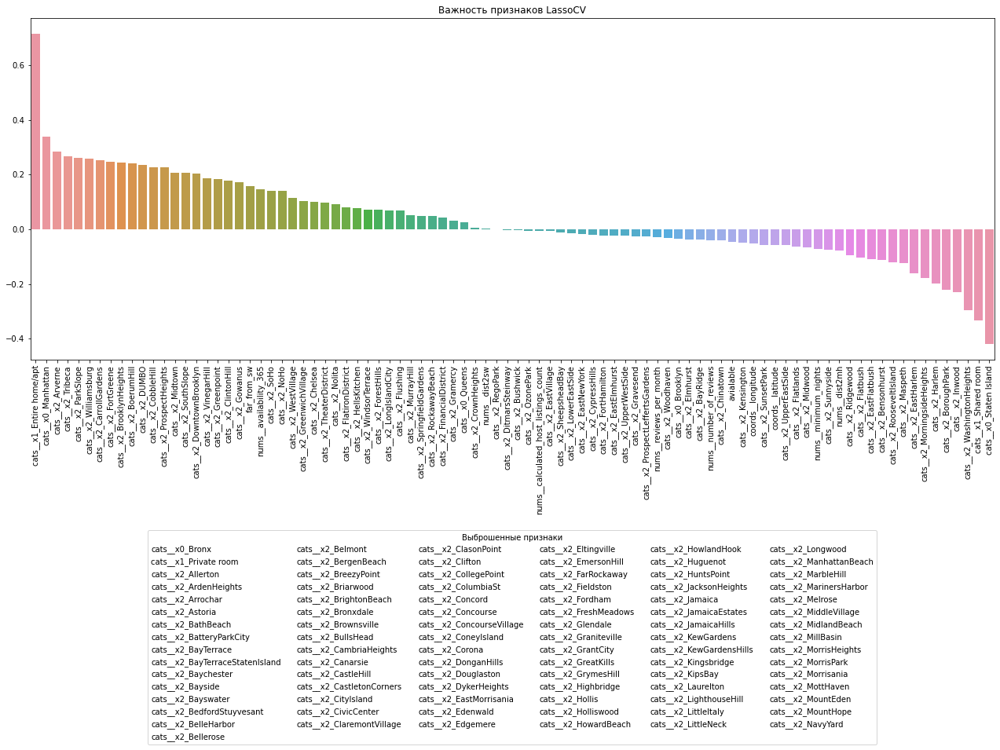

In [129]:
droppedLasso = plot_feature_importance(estimators, "LassoCV")

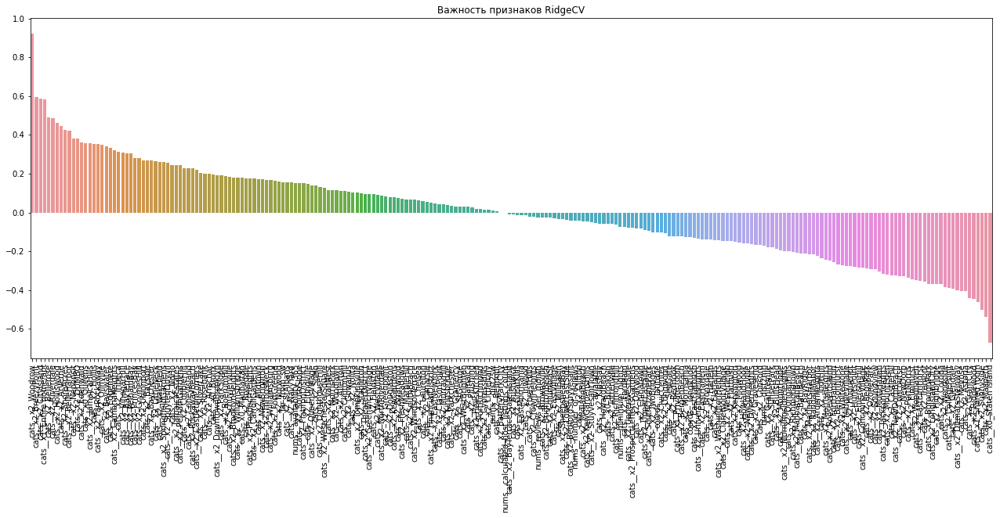

In [130]:
_ = plot_feature_importance(estimators, "RidgeCV")

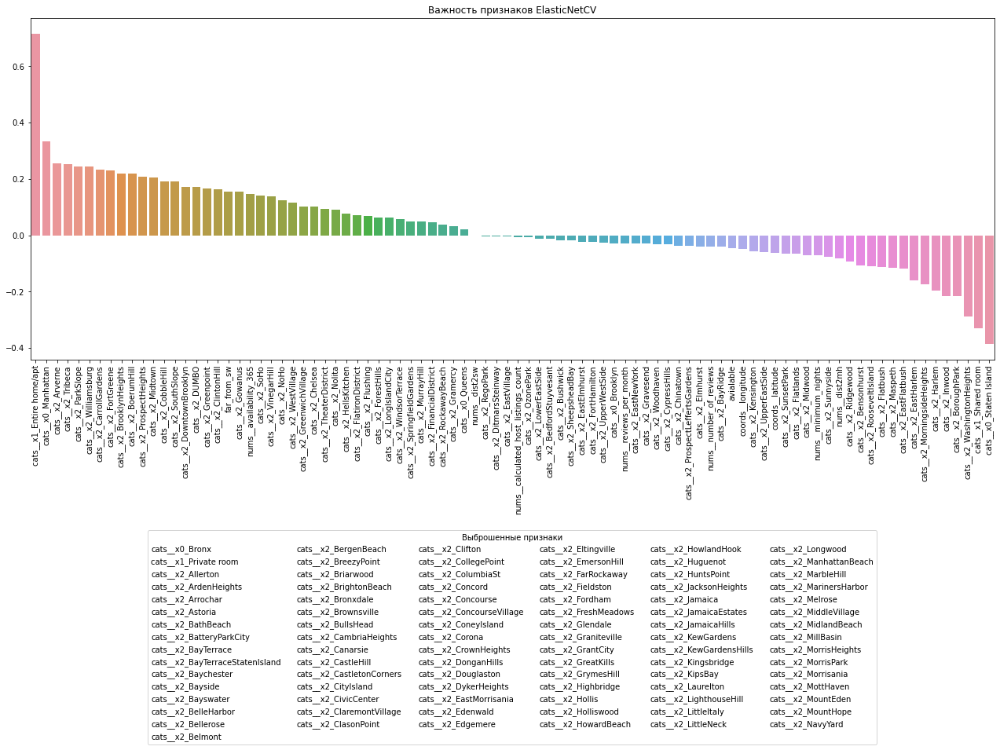

In [131]:
droppedElastic = plot_feature_importance(estimators, "ElasticNetCV")

<a id="selection"></a>
# Отбор признаков на основе коэффициентов [⇑](#toc)

<a id="selLasso"></a>
## Отбор признаков на основе коэффициентов LassoCV [⇑](#toc)

In [141]:
len(droppedLasso)

144

In [132]:
estimators = get_estimators(dropped_feats=droppedLasso, add_avialable=True, add_sw_farness=True, transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Отбор признаков по LassoCV', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 Pipeline(steps=[('fp',
                                  ColumnTransformerDf(remainder='drop',
                                                      transformers=[('nums',
                                                                     Pipeline(steps=[('log',
                                                                                      FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                                     ('scaler',
                                                                                      StandardScaler())]),
                                                                     ['minimum_nights',
                                                                      'number_of_reviews',
                                                                      'reviews_per_month',
                                                                      'calculated_host_listings_count',
                                                                      'availability_365',
                                                                      'dist2mh',
                                                                      'dist2sw']),
                                                                    ('cats',
                                                                     OneHotEncode...
                                                                    ('avialable',
                                                                     'passthrough',
                                                                     ['avialable'])])),
                                 ('fs',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('feature_selection',
                                                                   'drop',
                                                                   <function get_estimators.<locals>.get_preprocessor.<locals>.<lambda> at 0x000002CBBE1484C0>)]))])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.4163,73.9801,43.5630,24.2158
RidgeCV,0.4162,73.9867,43.5608,24.2368
LassoCV,0.4119,74.2581,43.6143,24.3685
ElasticNetCV,0.4110,74.3159,43.6357,24.3580


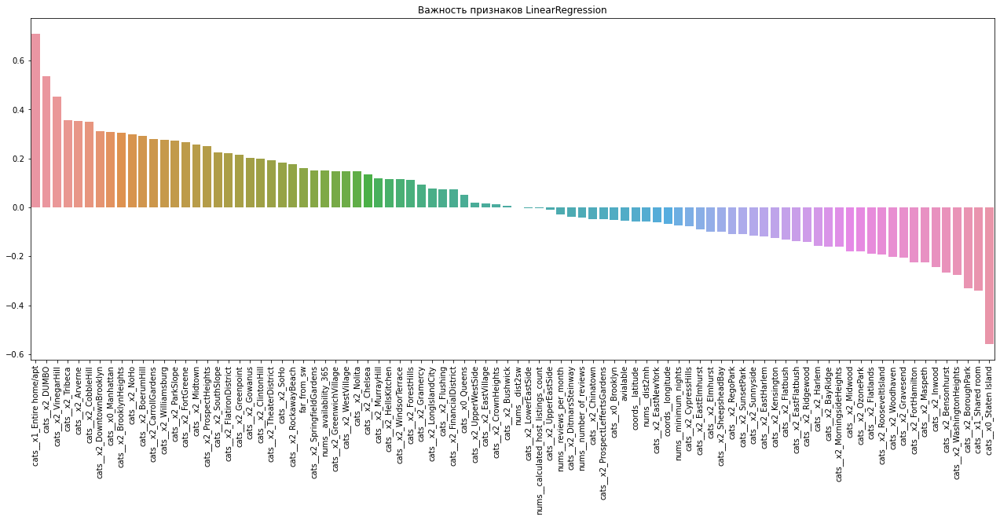

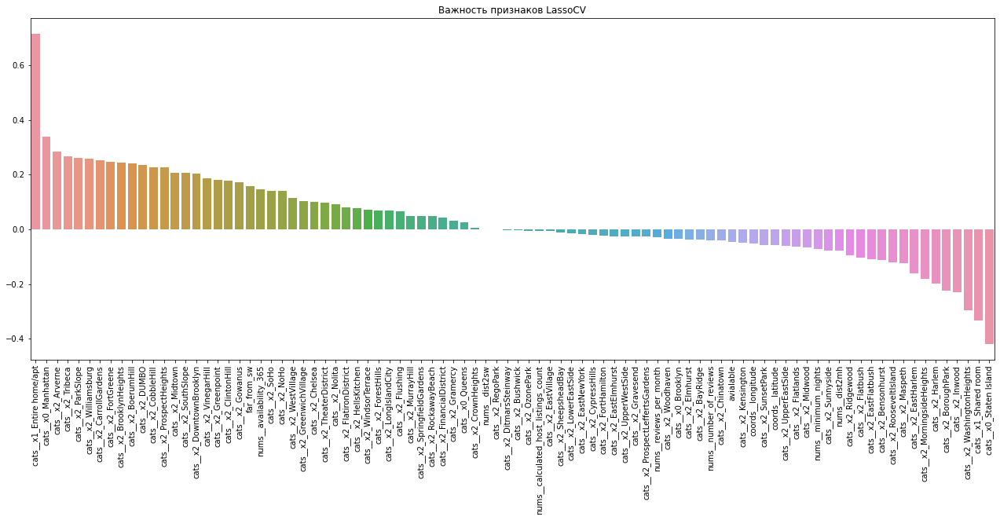

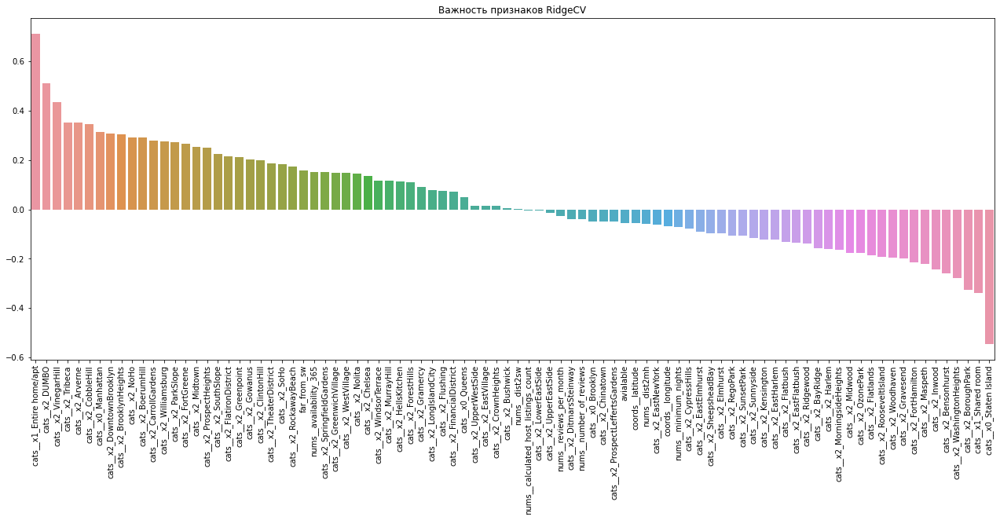

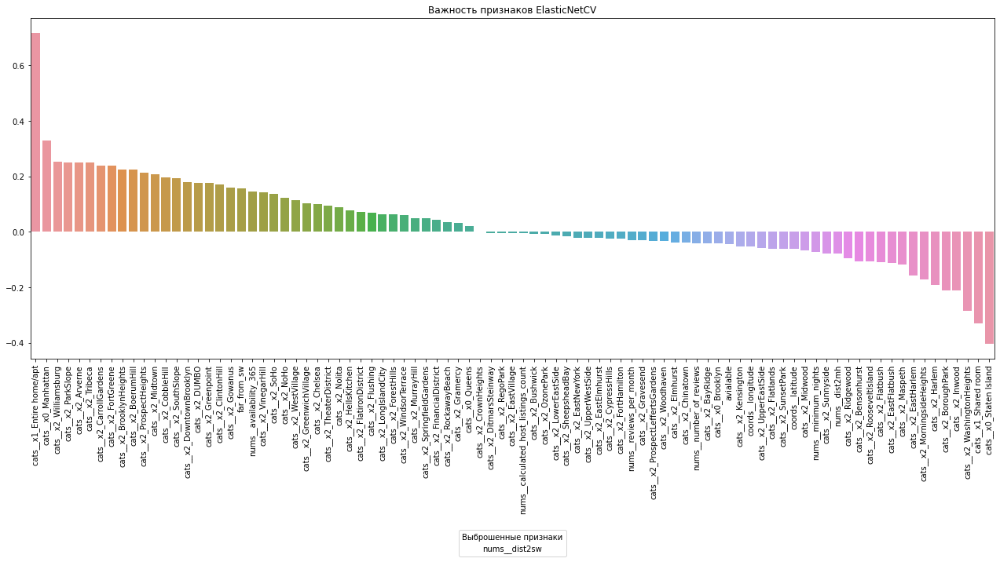

In [133]:
plot_feature_importance(estimators, "LinearRegression")
plot_feature_importance(estimators, "LassoCV")
plot_feature_importance(estimators, "RidgeCV")
_ = plot_feature_importance(estimators, "ElasticNetCV")

<a id="selElastic"></a>
## Отбор признаков на основе коэффициентов ElasticNetCV [⇑](#toc)

In [134]:
estimators = get_estimators(dropped_feats=droppedElastic, add_avialable=True, add_sw_farness=True, transform_target=best_transform_target, log_transform_feat=True, add_mh_dist=True, add_metro_dist=True, scaler=best_scaler, cats_mode=best_cats_mode)
plot_results('Отбор признаков по ElasticNetCV', estimators, X_train, X_test, y_train, y_test)

Pipeline(steps=[('pp',
                 Pipeline(steps=[('fp',
                                  ColumnTransformerDf(remainder='drop',
                                                      transformers=[('nums',
                                                                     Pipeline(steps=[('log',
                                                                                      FunctionTransformer(func=<ufunc 'log1p'>)),
                                                                                     ('scaler',
                                                                                      StandardScaler())]),
                                                                     ['minimum_nights',
                                                                      'number_of_reviews',
                                                                      'reviews_per_month',
                                                                      'calculated_host_listings_count',
                                                                      'availability_365',
                                                                      'dist2mh',
                                                                      'dist2sw']),
                                                                    ('cats',
                                                                     OneHotEncode...
                                                                    ('avialable',
                                                                     'passthrough',
                                                                     ['avialable'])])),
                                 ('fs',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('feature_selection',
                                                                   'drop',
                                                                   <function get_estimators.<locals>.get_preprocessor.<locals>.<lambda> at 0x000002CBBE151790>)]))])),
                ('ml',
                 TransformedTargetRegressor(func=<ufunc 'log1p'>,
                                            inverse_func=<ufunc 'expm1'>,
                                            regressor=ElasticNetCV()))])

,${\bar{R}}^2$,RMSE,MAE,MedAE
Предыдущий лидер,0.4184,73.8194,47.3513,31.5410
LinearRegression,0.4163,73.9835,43.5639,24.2253
RidgeCV,0.4162,73.9896,43.5619,24.2397
LassoCV,0.4119,74.2592,43.6153,24.3645
ElasticNetCV,0.4110,74.3153,43.6367,24.3638


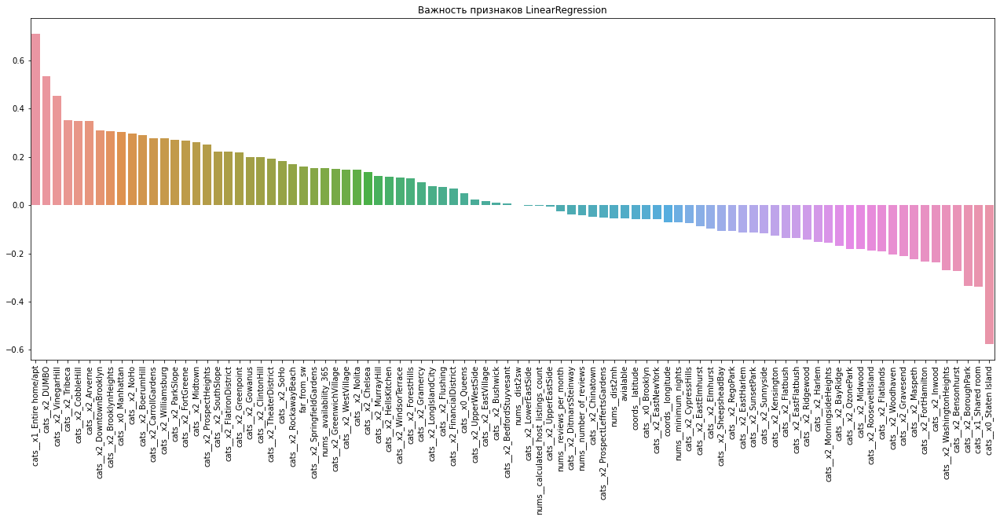

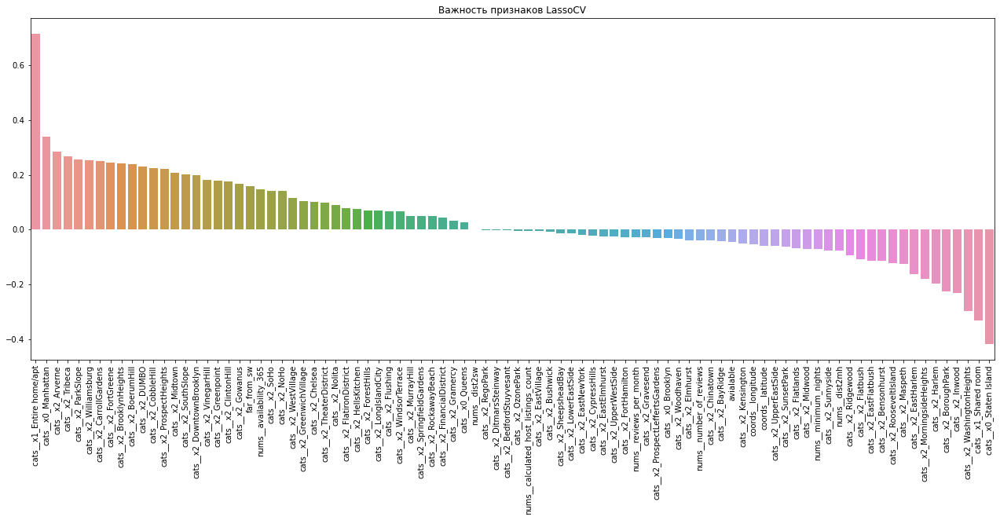

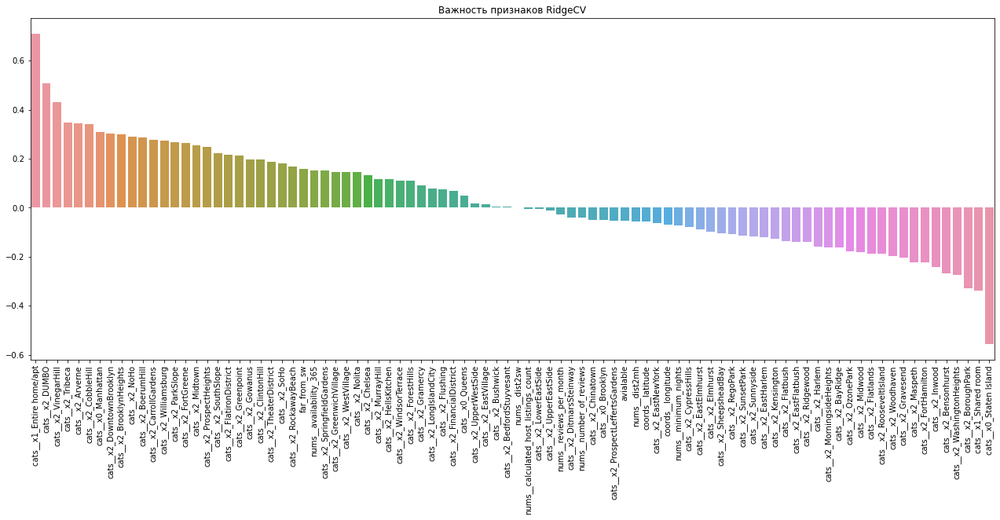

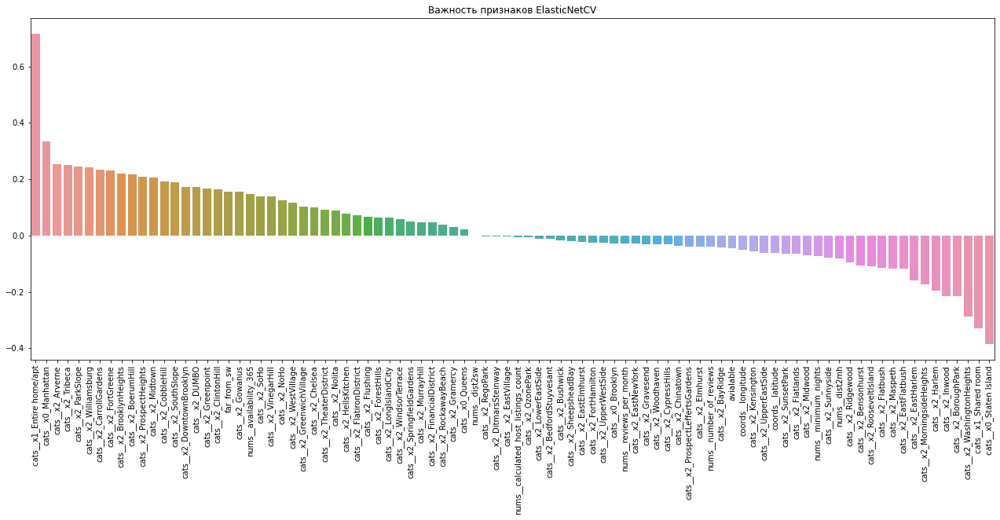

In [135]:
plot_feature_importance(estimators, "LinearRegression")
plot_feature_importance(estimators, "LassoCV")
plot_feature_importance(estimators, "RidgeCV")
_ = plot_feature_importance(estimators, "ElasticNetCV")

<a id="total"></a>
# Сводная таблица результатов [⇑](#toc)

In [140]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.float_format', lambda x: '%.4f' % x)
measured_metrics.T.sort_values(by=r'RMSE', ascending=True)

,${\bar{R}}^2$,RMSE,MAE,MedAE
Log RidgeCV,0.4184,73.8194,47.3513,31.5410
Log LassoCV,0.4171,73.9061,47.3645,31.4758
Признак доступности RidgeCV,0.4107,73.9102,43.4812,24.1222
Признак доступности LinearRegression,0.4099,73.9647,43.5376,24.1598
Отбор признаков по LassoCV LinearRegression,0.4163,73.9801,43.5630,24.2158
Признак удалённости от метро RidgeCV,0.4096,73.9818,43.5252,24.0968
Отбор признаков по ElasticNetCV LinearRegression,0.4163,73.9835,43.5639,24.2253
Отбор признаков по LassoCV RidgeCV,0.4162,73.9867,43.5608,24.2368
Отбор признаков по ElasticNetCV RidgeCV,0.4162,73.9896,43.5619,24.2397
Cтратификация по neighbourhood_group RidgeCV,0.4091,74.0184,43.5344,24.0970
